# <span style="color:green"> GPCRDB </span>

In [1]:
import gpcr_package as gpcr


>>>>>>>>>>>>>>>>> Testing dependencies...
`gpcr_package` depends on the following packages:
['ProgressBar', 'Seq', 'SeqIO', 'ceil', 'clr', 'colored', 'cprint', 'datetime', 'display', 'floor', 'go', 'it', 'kurtosis', 'norm', 'np', 'os', 'pd', 'pickle', 'plt', 'skew', 'stat', 'style']
<<<<<<<<<<<<<<<<< Dependencies test successful!


>>>>>>>>>>>>>>>>> Testing constants...
`gpcr_package` uses the following constants:
['AA', 'AA_ABBREVATIONS', 'AA_ABBRE_LONG_NAMES', 'AA_ABBRE_SHORT_NAMES', 'AA_CHARGES_PH7', 'AA_HYDRO_PHOBICITY_PH2', 'AA_HYDRO_PHOBICITY_PH7', 'AA_LONG_NAMES', 'AA_SHORT_NAMES', 'BINS_PLOT_HIST', 'COLOR_AT', 'COLOR_COLORBAR_CMAP', 'COLOR_COLORBAR_CMAP_RED_BLUE', 'COLOR_CONFI_LINE', 'COLOR_FIT_GAUSSIAN', 'COLOR_GPCR_CLASSES', 'COLOR_GPCR_CLASSES_ALL', 'COLOR_LT', 'COLOR_MEAN_LINE', 'COLOR_MEDIAN_LINE', 'COLOR_PLOT_HIST_DEFAULT', 'COLOR_PLOT_LINE', 'COLOR_PLOT_SCATTER', 'COLOR_QUANTILE_LINE', 'COLOR_SEQ_COMPARISION_LENGTH_COMPARISION', 'COLOR_SEQ_COMPARISION_LENGTH_NON_COMPARI

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statistics as stat
import time
from Bio.Seq import Seq

100% |########################################################################|


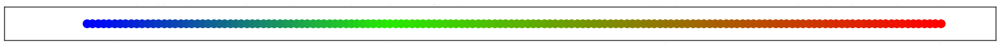

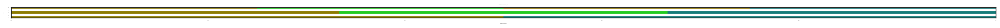

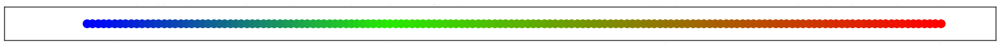

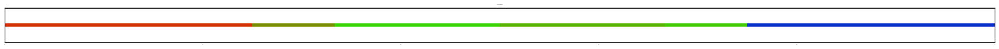

In [6]:
sequences = ["ASYR", "ASR", "AR"]
a = gpcr.line_hydrophobicity_in_sequences( sequences    = sequences,
# a = gpcr.line_hydrophobicity_in_sequences( sequences    = gpcr.GPCR_DF[0:3]["seq"],
                                           scale_factor = 0.45,
                                           figsize      = (30, 0.3),
                                           normalized   = True,
                                           savefig      = False,
                                           title_add    = ", ph = 2"
                                         ) 

100% |########################################################################|


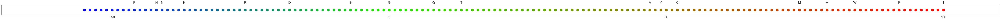

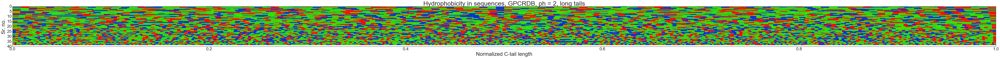

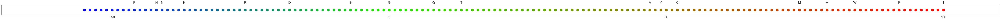

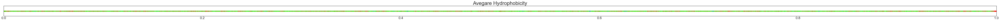

In [5]:
_ = gpcr.line_hydrophobicity_in_sequences( df           = gpcr.GPCRDB_DF,
                                           normalized   = True,
                                           linewidth    = 6,
                                           scale_factor = 3,
                                           figsize      = (100, 4),
                                           savefig      = False,
                                           threshold_len_min   = 110,
                                           # threshold_len_max   = None,
                                           title_add    = ", ph = 2, long tails"
                                         ) 

In [9]:
a = "ENQC"
b = "ASTY"
c = "AST"
d = "AS"
sequences          = [a, b, c, d]

locs_aas_sequences = [ list( np.array( range( len(seq) ) ) / len(seq) ) for seq in sequences ]

positions_all      = list( set( sum(locs_aas_sequences, []) ) )
positions_all.sort()
print( "positions_all = ", positions_all )
print()

sequences_new      = [[]] * len(sequences)

for k, seq in enumerate(sequences):
    sequences_new[k] = [""] * ( len(positions_all) - 1)
    sequences_new[k] = [""] * ( len(positions_all))
    j          = 0
    aa_current = seq[j]
    aa_next    = seq[j+1]
    loc_end    = (len(seq) - 1) / len(seq)
    for i, pos in enumerate(positions_all):
        if pos > loc_end or pos < locs_aas_sequences[k][j+1]:
            sequences_new[k][i] = aa_current
        else:
            sequences_new[k][i] = aa_next
            j          = j + 1
            aa_current = seq[j]
            if j < len(seq)-1: aa_next = seq[j+1]
    sequences_new[k] = ''.join(sequences_new[k])

print("sequences_new = ", sequences_new)

positions_all =  [0.0, 0.25, 0.3333333333333333, 0.5, 0.6666666666666666, 0.75]

sequences_new =  ['ENNQQC', 'ASSTTY', 'AASSTT', 'AAASSS']


In [10]:
for i in range(len(sequences_new[0])):
    hydrophobicity_aas_pos     = [ gpcr.AA.HYDRO_PHOBICITY_PH2[aa] for aa in [ aa[i] for aa in sequences_new ] ]
    print(hydrophobicity_aas_pos)

[8, 47, 47, 47]
[-41, -7, 47, 47]
[-41, -7, -7, 47]
[8, 13, -7, -7]
[8, 13, 13, -7]
[52, 49, 13, -7]


In [3]:
len(gpcr.GPCRDB_DF)

369

In [4]:
gpcr.GPCRDB_DF["seq_len"].max()

530

In [5]:
sequences = ["PTAIPTAI",
             "PTAI", 
             "PTAI", 
             "PI", 
             "SC"]

In [ ]:
ABCDABCD
ABCD
AB

In [ ]:
ABCDABCD
AABBCCDD


In [102]:
sum([[1,2,3], [4,5,6]], [])

[1, 2, 3, 4, 5, 6]

In [7]:
# Working >>

len_max = max( [ len(seq) for seq in sequences ] )

pos_len_max_normalized = [ pos / len_max for pos in range(len_max) ]

pos_normalized = [[]] * len(sequences)
for i, seq in enumerate(sequences):
    pos_normalized[i] = [ pos / len(seq) for pos in range(len(seq)) ]

aas_pos    = [ [""]*len(sequences) ] * len_max
aas_pos[0] = [ seq[0] for seq in sequences ]
print(aas_pos[0])
pos_normalized_check = [ pos_norm[1] for pos_norm in pos_normalized ]
counter_check = [ 1 for _ in sequences ]
out    = [0] * len_max
out[0] = aas_pos[0]
for pos in range(1, len_max):
    for i, seq in enumerate(sequences):
        if pos_normalized_check[i] <= pos_len_max_normalized[pos]:
            aas_pos[pos][i]         = seq[counter_check[i]]
            pos_normalized_check[i] = pos_normalized[i][counter_check[i] + 1] if counter_check[i] + 1 < len(seq) else 1
            counter_check[i]        = counter_check[i] + 1
        else:
            aas_pos[pos][i]         = aas_pos[pos-1][i]
        out[pos] = tuple(aas_pos[pos])
    print(aas_pos[pos])
out = [ list(item) for item in out ]
out

['P', 'P', 'P', 'P', 'S']
['T', 'P', 'P', 'P', 'S']
['A', 'T', 'T', 'P', 'S']
['I', 'T', 'T', 'P', 'S']
['P', 'A', 'A', 'I', 'C']
['T', 'A', 'A', 'I', 'C']
['A', 'I', 'I', 'I', 'C']
['I', 'I', 'I', 'I', 'C']


[['P', 'P', 'P', 'P', 'S'],
 ['T', 'P', 'P', 'P', 'S'],
 ['A', 'T', 'T', 'P', 'S'],
 ['I', 'T', 'T', 'P', 'S'],
 ['P', 'A', 'A', 'I', 'C'],
 ['T', 'A', 'A', 'I', 'C'],
 ['A', 'I', 'I', 'I', 'C'],
 ['I', 'I', 'I', 'I', 'C']]

Total count: 369
Nan count:   0
Hist Count:  369
Min:         0.0
Mean:        3.6319
Median:      3.6376
Max:         6.272877006546167
Skew:        -0.2889103384267708
kurtosis:    1.5811116268360141


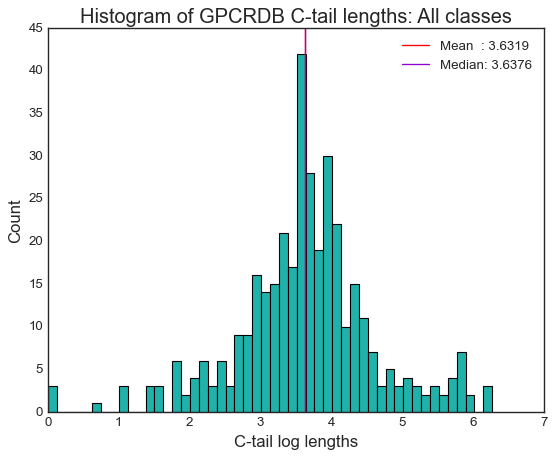

In [7]:
_ = gpcr.hist_quick(np.log(gpcr.GPCRDB_DF["seq_len"]),
                    title       = "Histogram of GPCRDB C-tail lengths: All classes",
                    label_xaxis = "C-tail log lengths",
                   )

Total count: 289
Nan count:   0
Hist Count:  289
Min:         0.0
Mean:        3.5070
Median:      3.5835
Max:         5.8664680569332965
Skew:        -0.9183519682970138
kurtosis:    2.6424619899297337


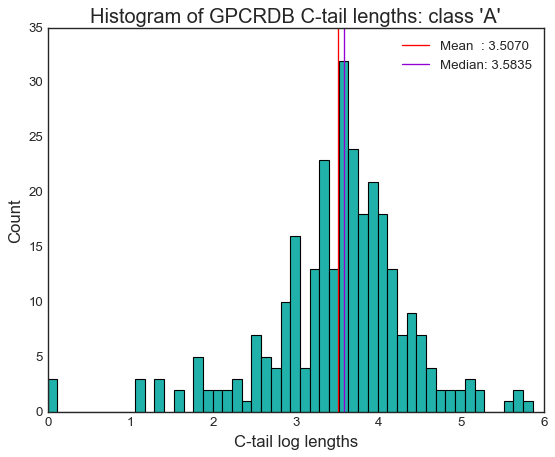

In [8]:
_ = gpcr.hist_quick(np.log(gpcr.GPCRDB_DF[ gpcr.GPCRDB_DF["class"] == "A" ]["seq_len"]),
                    title       = "Histogram of GPCRDB C-tail lengths: class 'A'",
                    label_xaxis = "C-tail log lengths",
                   )

Total count: 15
Nan count:   0
Hist Count:  15
Min:         18
Mean:        48.3333
Median:      40.0000
Max:         108
Skew:        1.106399657145312
kurtosis:    -0.007154325498150982


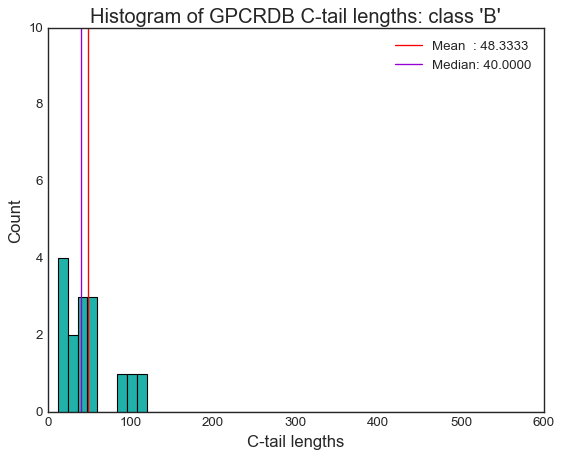

In [9]:
_ = gpcr.hist_quick(gpcr.GPCRDB_DF[ gpcr.GPCRDB_DF["class"] == "B" ]["seq_len"],
                    title       = "Histogram of GPCRDB C-tail lengths: class 'B'",
                    label_xaxis = "C-tail lengths",
                    ylim        = (0, 10),
                    xlim        = (0, 600)
                   )

Total count: 369
Nan count:   0
Hist Count:  369
Min:         1
Mean:        61.3442
Median:      38.0000
Max:         530
Skew:        3.307336414973185
kurtosis:    12.140455396430372


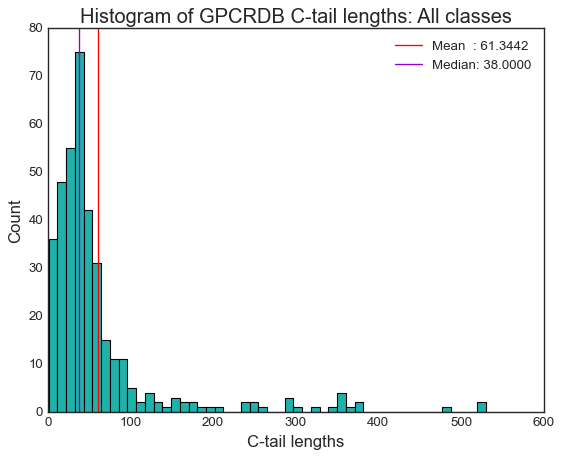

In [10]:
_ = gpcr.hist_quick(gpcr.GPCRDB_DF["seq_len"],
                    title       = "Histogram of GPCRDB C-tail lengths: All classes",
                    label_xaxis = "C-tail lengths",
                   )

Total count: 11
Nan count:   0
Hist Count:  11
Min:         9
Mean:        76.3636
Median:      46.0000
Max:         234
Skew:        1.0012684867017507
kurtosis:    -0.5122477356208055


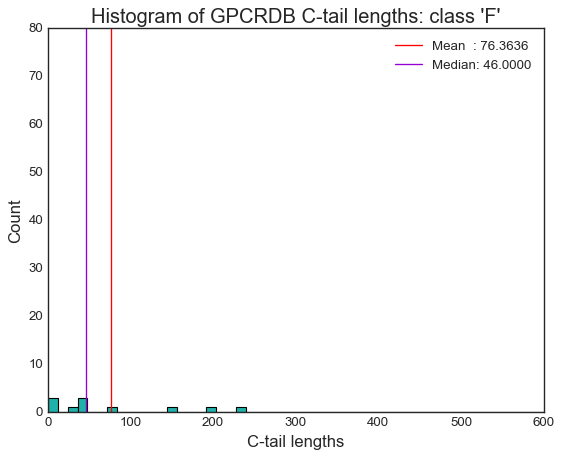

In [11]:
_ = gpcr.hist_quick(gpcr.GPCRDB_DF[ gpcr.GPCRDB_DF["class"] == "F" ]["seq_len"],
                    title       = "Histogram of GPCRDB C-tail lengths: class 'F'",
                    label_xaxis = "C-tail lengths",
                    ylim        = (0, 80),
                    xlim        = (0, 600)
                   )

In [12]:
for thres in [100, 130, 150, 200]:
    fig = gpcr.plots.sankey_gpcr_classes( df        = gpcr.GPCRDB_DF,
                                          threshold = thres )

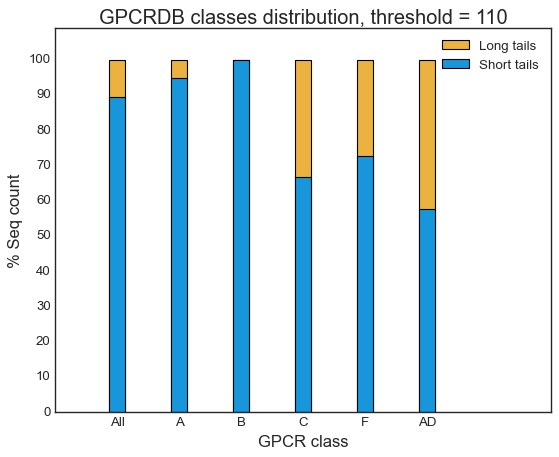

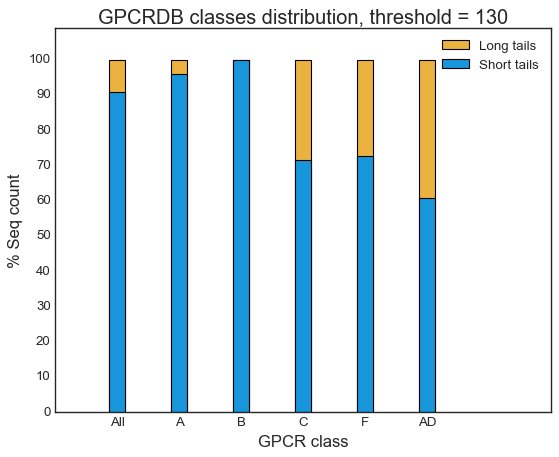

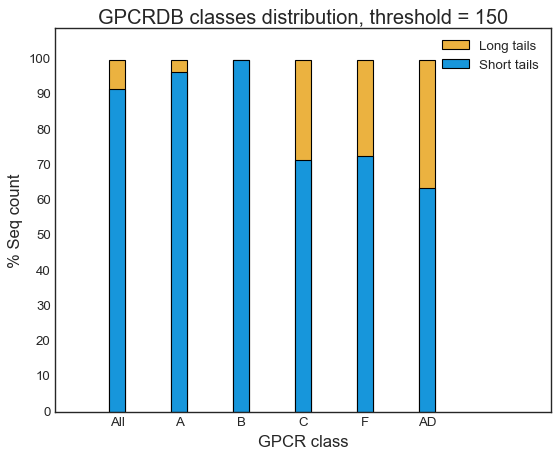

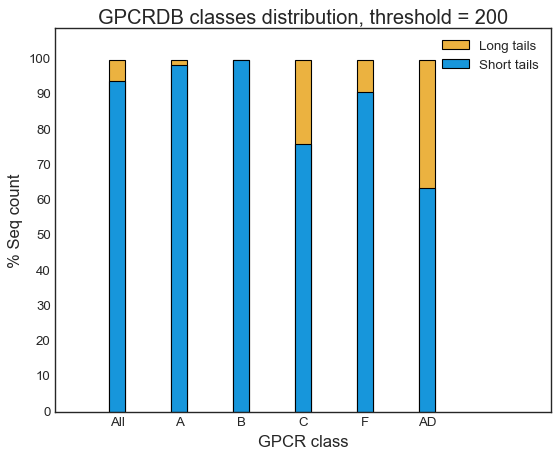

In [13]:
for thres in [110, 130, 150, 200]:
    _ = gpcr.bar_gpcr_classes(df         = gpcr.GPCRDB_DF,
                              threshold  = thres,
                              xlim       = (None, 7),
                              ylim       = (None, 109),
                             )

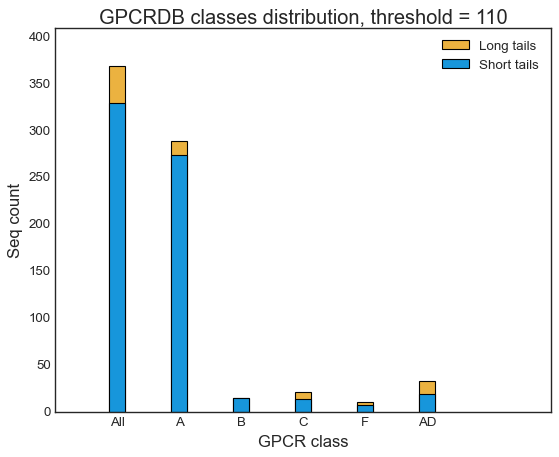

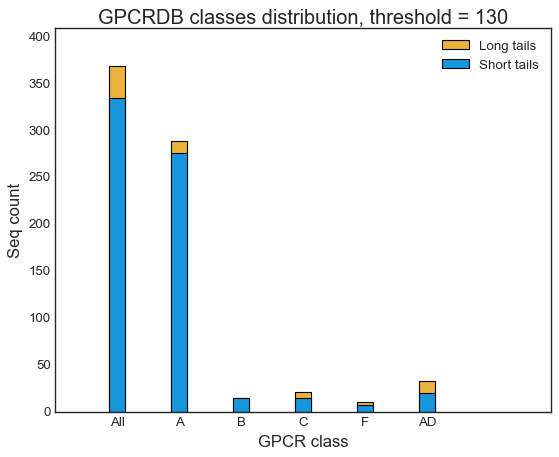

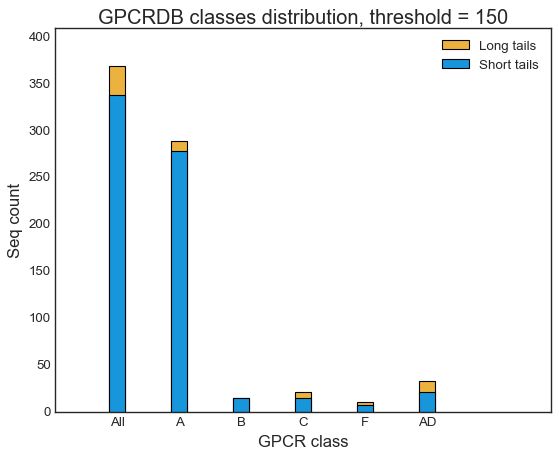

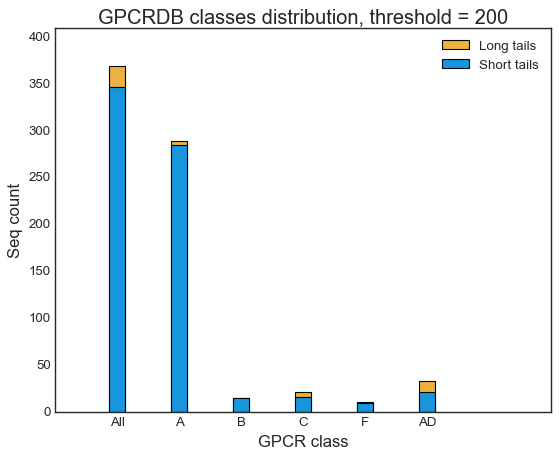

In [14]:
for thres in [110, 130, 150, 200]:
    _ = gpcr.bar_gpcr_classes(df         = gpcr.GPCRDB_DF,
                              threshold  = thres,
                              normalized = False,
                              stacked    = True,
                              xlim       = (None, 7),
                              ylim       = (None, 410),
                             )

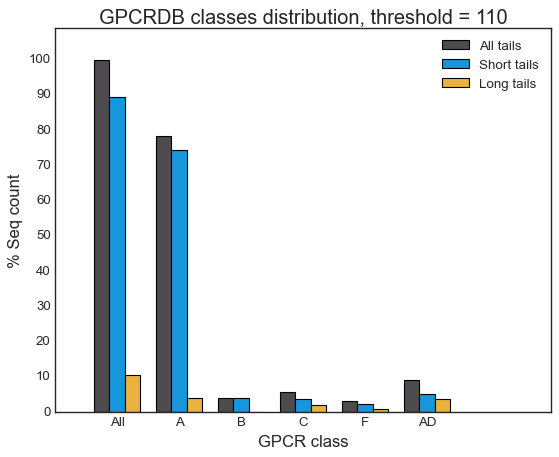

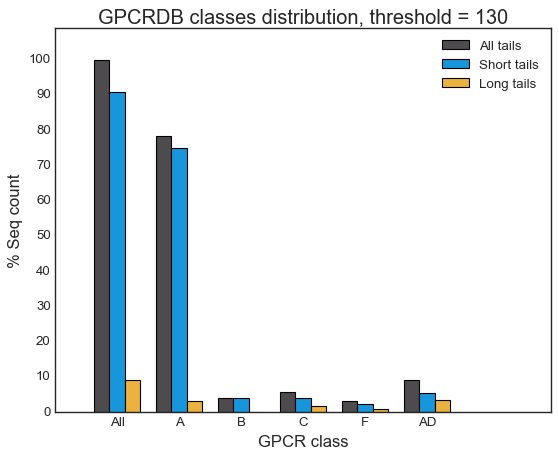

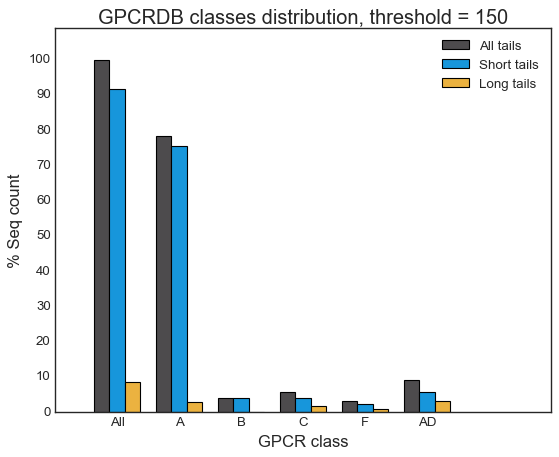

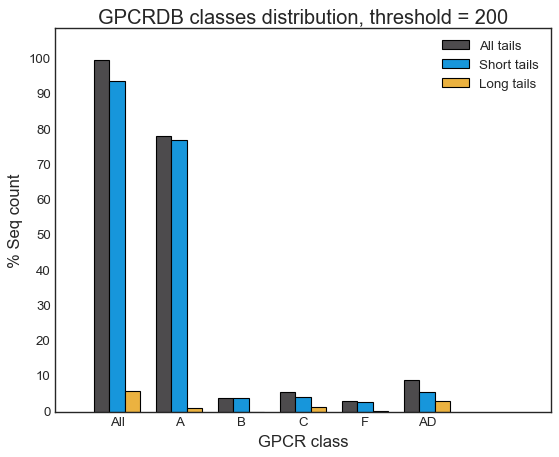

In [15]:
for thres in [110, 130, 150, 200]:
    _ = gpcr.bar_gpcr_classes(df         = gpcr.GPCRDB_DF,
                              threshold  = thres,
                              normalized = True,
                              stacked    = False,
                              xlim       = (None, 7),
                              ylim       = (None, 109),
                             )

# AA Count

### All tails

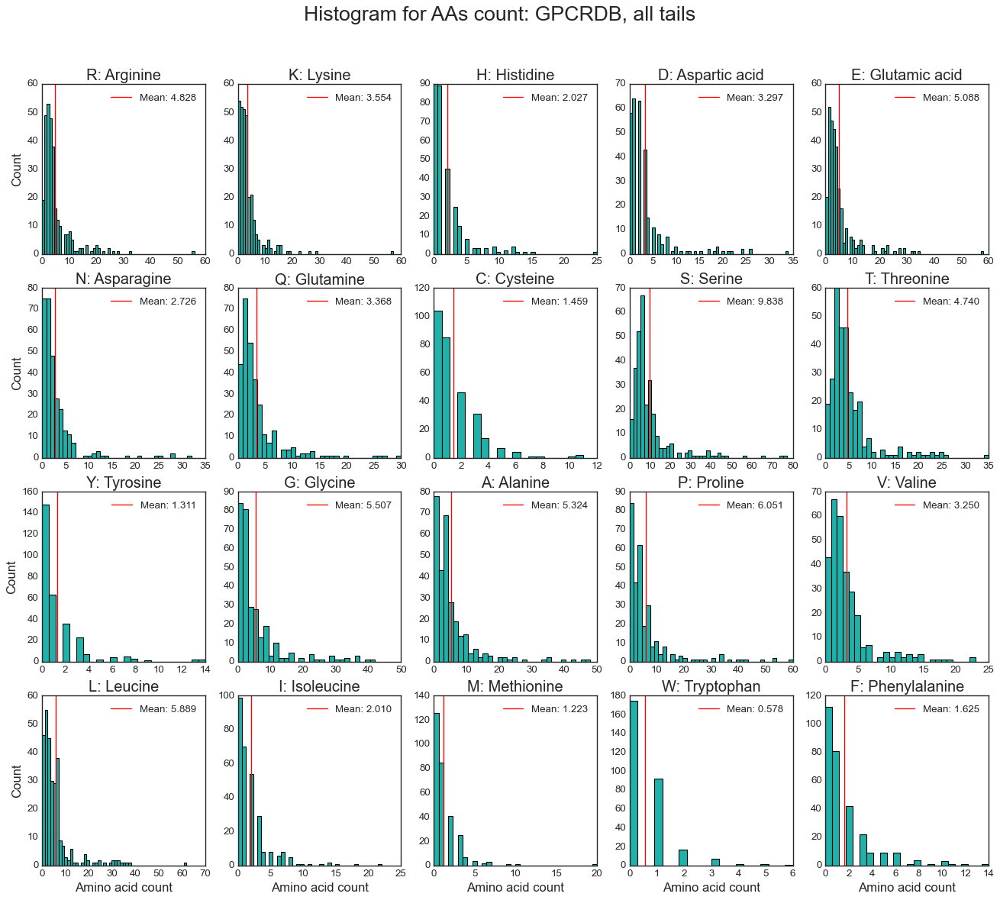

In [16]:
fig = gpcr.grid_hist_proteins_residue_relative_count(   df         = gpcr.GPCRDB_DF,
                                                        relative_count    = False,
                                                        title_add         = ", all tails",
                                                        sharex            = False,
                                                        sharey            = False,
                                                    )

### Short tails

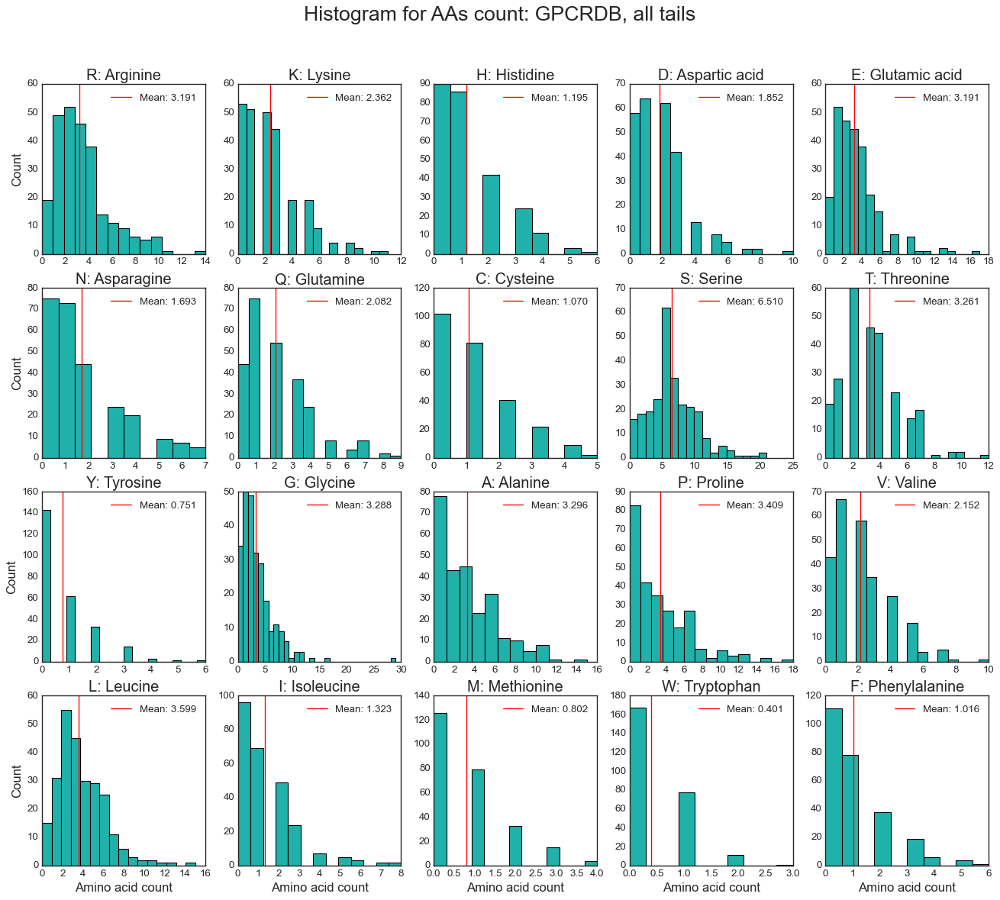

In [17]:
fig = gpcr.grid_hist_proteins_residue_relative_count(   df         = gpcr.GPCRDB_DF,
                                                        relative_count    = False,
                                                        title_add         = ", all tails",
                                                        threshold_len_min = gpcr.GPCR_DF.threshold_len_min,
                                                        threshold_len_max = gpcr.GPCR_DF.threshold,
                                                        sharex            = False,
                                                        sharey            = False,
                                                    )

### Long tails

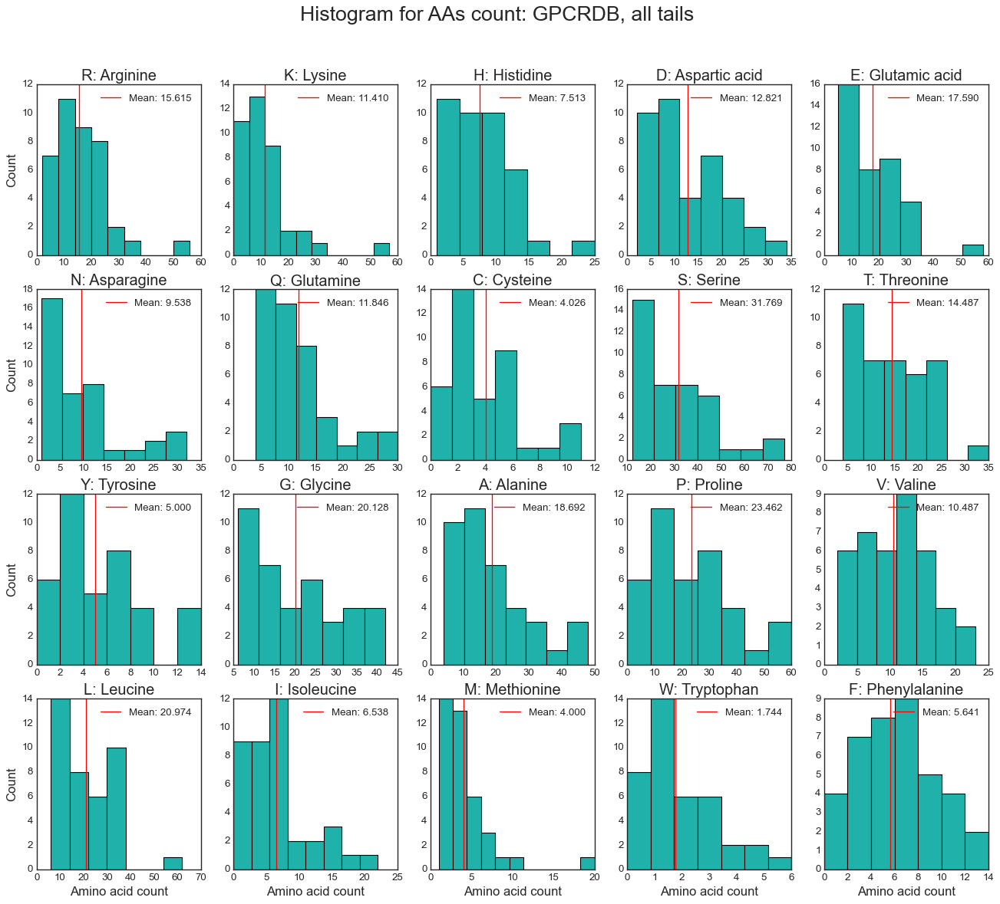

In [18]:
fig = gpcr.grid_hist_proteins_residue_relative_count(   df         = gpcr.GPCRDB_DF,
                                                        relative_count    = False,
                                                        title_add         = ", all tails",
                                                        threshold_len_min = gpcr.GPCR_DF.threshold,
                                                        threshold_len_max = gpcr.GPCR_DF.threshold_len_max,
                                                        sharex            = False,
                                                        sharey            = False,
                                                    )

# AA Relative Count

### Disport relative count

In [19]:
target_type = "mean"
show        = False
_, means_disprot, left_stderr_disprot, right_stderr_disprot  = gpcr.grid_hist_proteins_residue_relative_count( df          = gpcr.DISPROT_DF,
                                                                                                               target_type = target_type,
                                                                                                               show        = show )
means_disprot

array([5.9934268 , 7.19331187, 2.02916944, 6.12232366, 8.87866488,
       3.78987119, 4.93455864, 1.1082458 , 9.66003269, 5.20539688,
       1.81161179, 7.71221003, 7.64066329, 8.4444791 , 4.38883741,
       6.91223376, 2.91412196, 2.18046858, 0.73788164, 2.3424906 ])

### Humon Proteome relative count

In [20]:
means_human = np.array( gpcr.CODONS_HOMO_SAPIENS_DF["freq_aa"] ) * 100
means_human

array([ 5.67,  5.63,  2.6 ,  4.69,  6.86,  3.61,  4.65,  2.32,  8.11,
        5.32,  2.75,  6.6 ,  6.93,  6.1 ,  6.07, 10.02,  4.43,  2.2 ,
        1.32,  3.79])

In [21]:
targets_x         = list( zip(means_disprot, means_human) )
targets_x_colors  = [["blue", "black"]] * 20
targets_x_labels  = [[f"Disprot: {mean_disprot:0.3f}", f"Human: {mean_human:0.3f}"] for mean_disprot, mean_human in zip(means_disprot, means_human) ]

### All tails

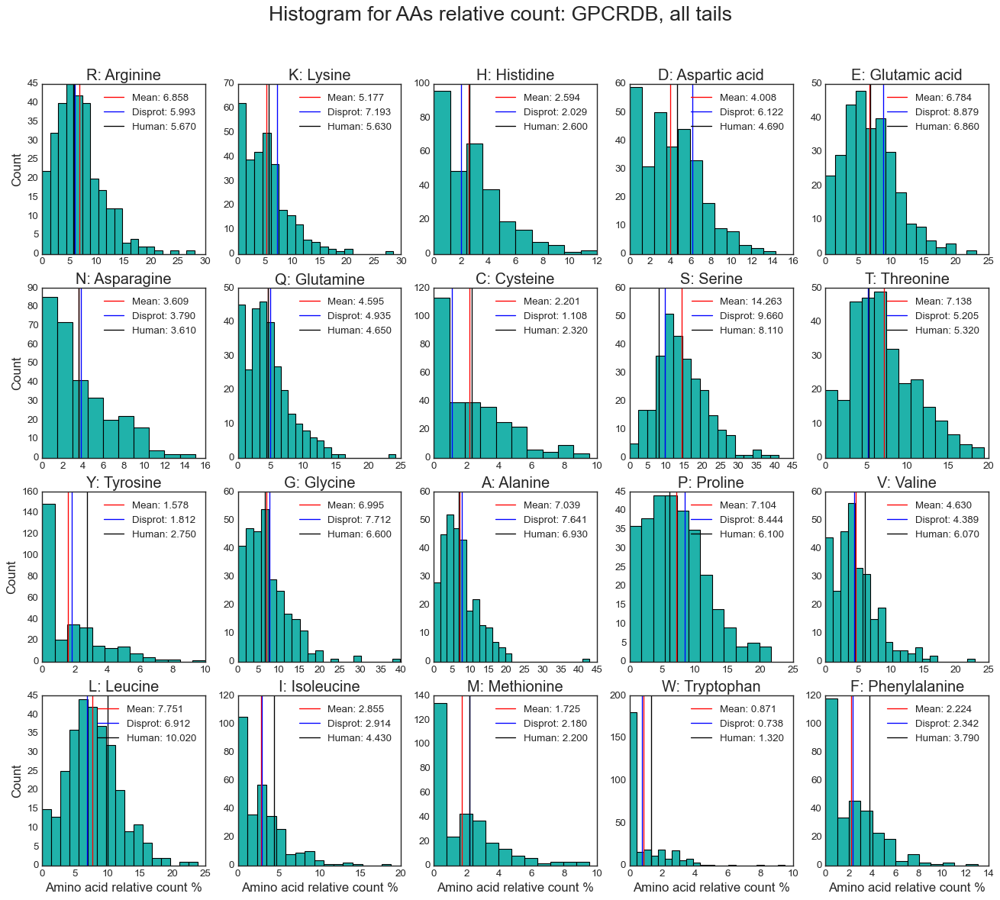

In [22]:
_, means_gpcrdb,  left_stderr_gpcrdb,  right_stderr_gpcrdb  = gpcr.grid_hist_proteins_residue_relative_count( 
                                                        df = gpcr.GPCRDB_DF,
                                                        relative_count    = True,
                                                        title_add         = ", all tails",
                                                        sharex            = False,
                                                        sharey            = False,
                                                        targets_x         = targets_x,
                                                        targets_x_colors  = targets_x_colors,
                                                        targets_x_labels  = targets_x_labels,
                                                    )

### Short tails

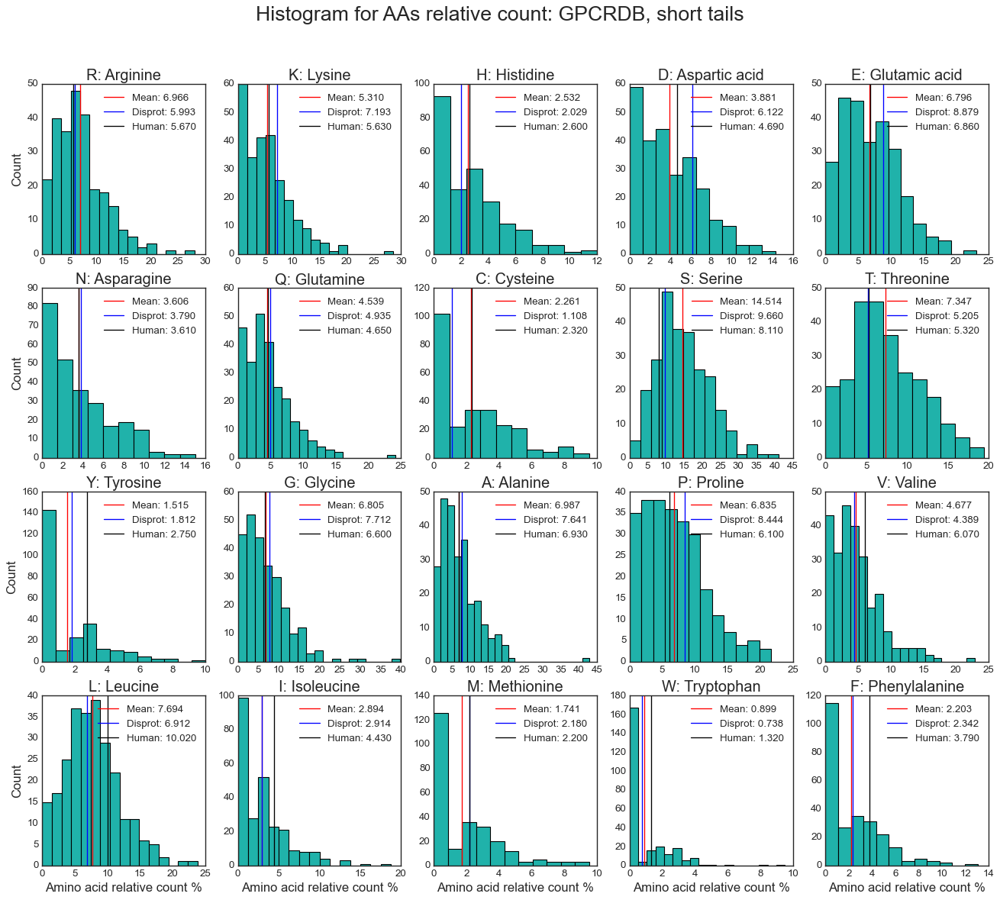

In [23]:
fig = gpcr.grid_hist_proteins_residue_relative_count(   df         = gpcr.GPCRDB_DF,
                                                        relative_count    = True,
                                                        title_add         = ", short tails",
                                                        threshold_len_min = gpcr.GPCR_DF.threshold_len_min,
                                                        threshold_len_max = gpcr.GPCR_DF.threshold,
                                                        sharex            = False,
                                                        sharey            = False,
                                                        targets_x         = targets_x,
                                                        targets_x_colors  = targets_x_colors,
                                                        targets_x_labels  = targets_x_labels,
                                                        )

### Long tails

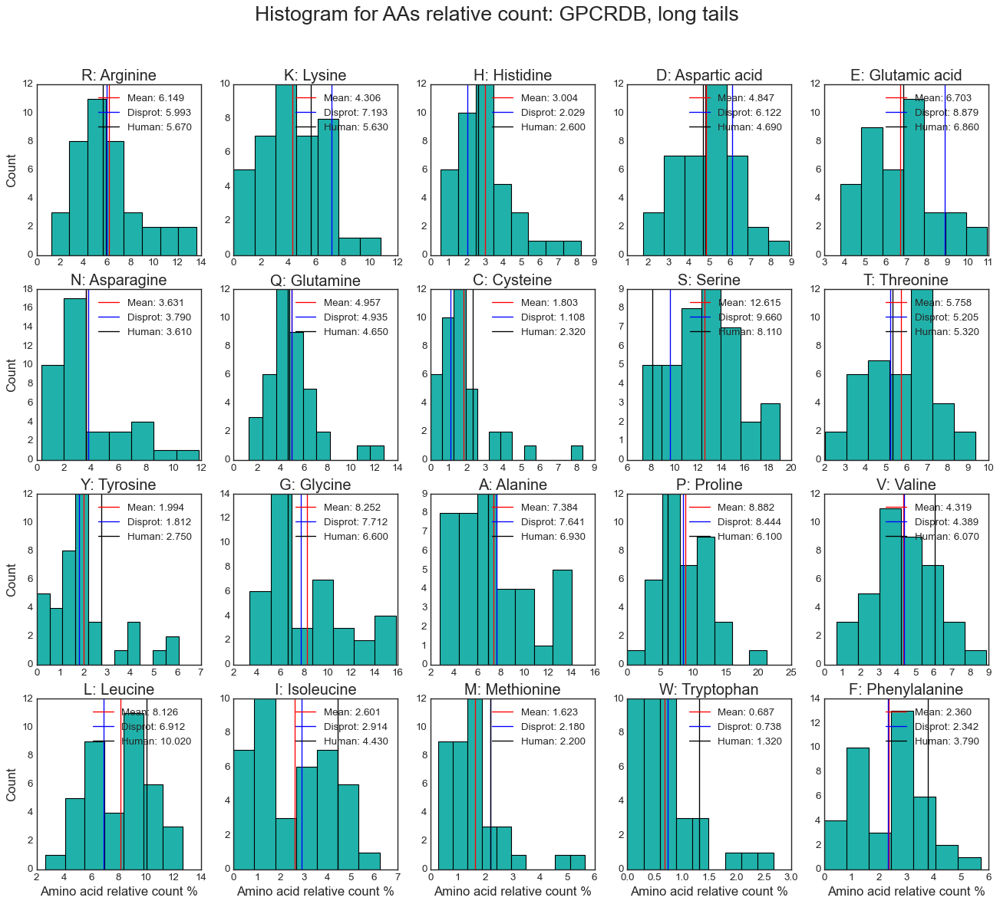

In [24]:
fig = gpcr.grid_hist_proteins_residue_relative_count(   df         = gpcr.GPCRDB_DF,
                                                        relative_count    = True,
                                                        title_add         = ", long tails",
                                                        threshold_len_min = gpcr.GPCR_DF.threshold,
                                                        threshold_len_max = gpcr.GPCR_DF.threshold_len_max,
                                                        sharex            = False,
                                                        sharey            = False,
                                                        targets_x         = targets_x,
                                                        targets_x_colors  = targets_x_colors,
                                                        targets_x_labels  = targets_x_labels,
                                                    )

# <span style="color:orange"> AA relative count in humans </span>

# Human proteome vs GPCRDB

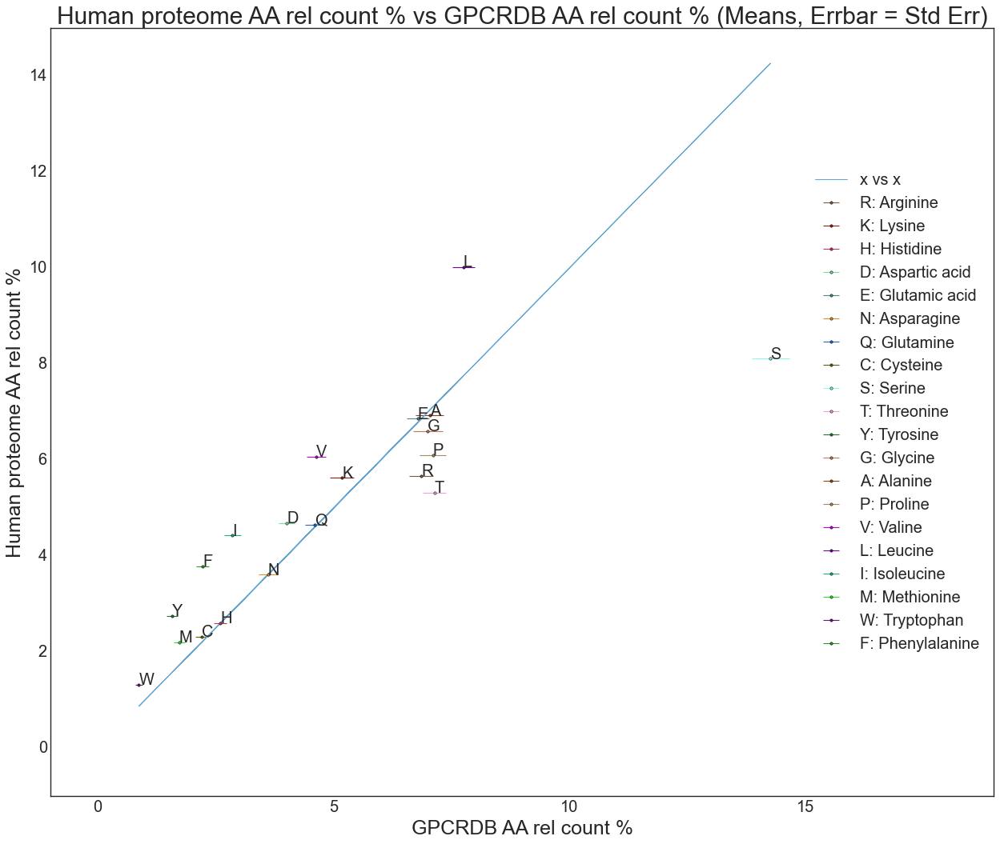

In [25]:
x       = means_gpcrdb
x_left  = left_stderr_gpcrdb
x_right = right_stderr_gpcrdb
y       = [ freq * 100 for freq in gpcr.CODONS_HOMO_SAPIENS_DF["freq_aa"] ]

xerr_left   = x       - x_left
xerr_right  = x_right - x

fig = gpcr.line_compare_points( x = x,
                                y = y,
                         xerr                = (xerr_left,   xerr_right),
                         # yerr                = (yerr_bottom, yerr_top),
                         figsize             = (19,15),
                         scale_factor        = 0.6,
                         errbar_linewidth    = 1,
                         errorbar_capsize    = 0,
                         errorbar_capthick   = 0,
                         scatter_marker_size = 3,
                         legend_location     = "center right",
                         xlim                = (-1, 19),
                         ylim                = (-1, 15),
                         label_xaxis         = "GPCRDB AA rel count %",
                         label_yaxis         = "Human proteome AA rel count %",
                         title_add           = f" (Means, Errbar = Std Err)"
                       )

# Disprot vs GPCRDB

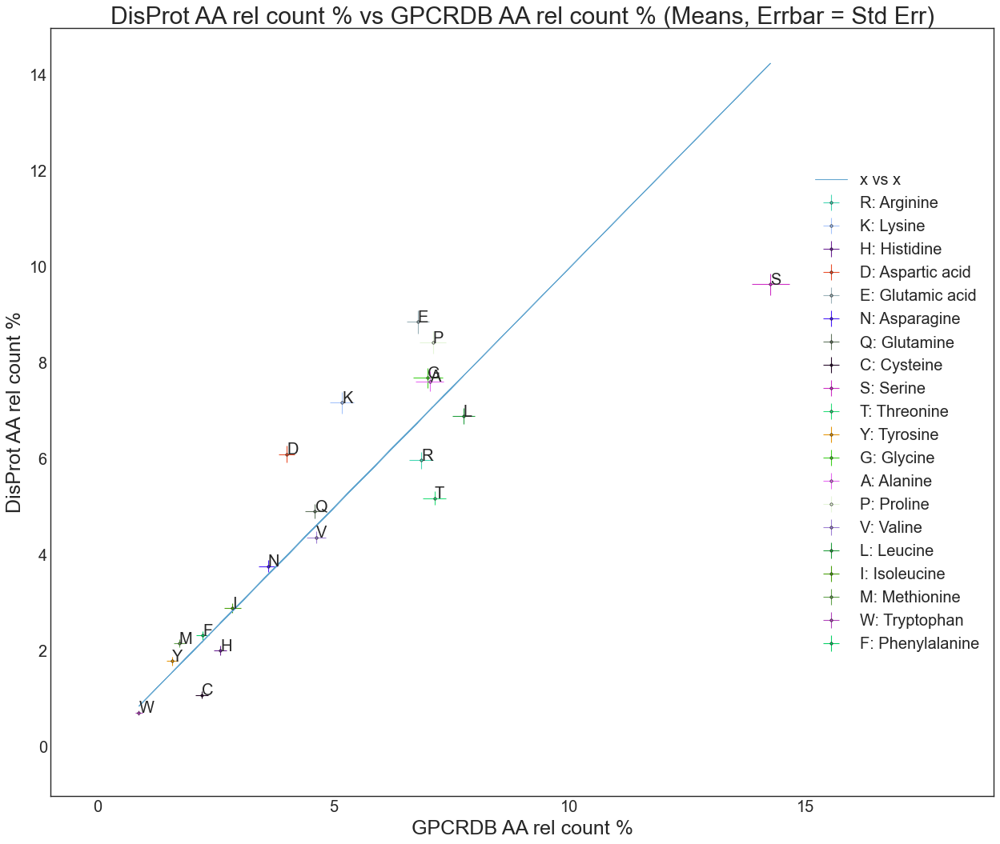

In [26]:
x = means_gpcrdb;  x_left   = left_stderr_gpcrdb;  x_right = right_stderr_gpcrdb
y = means_disprot; y_bottom = left_stderr_disprot; y_top   = right_stderr_disprot

xerr_left   = x       - x_left
xerr_right  = x_right - x
yerr_bottom = y       - y_bottom
yerr_top    = y_top   - y

fig = gpcr.line_compare_points( x = x,
                                y = y,
                         xerr                = (xerr_left,   xerr_right),
                         yerr                = (yerr_bottom, yerr_top),
                         figsize             = (19,15),
                         scatter_marker_size = 3,
                         scale_factor        = 0.6,
                         errbar_linewidth    = 1,
                         errorbar_capsize    = 0,
                         errorbar_capthick   = 0,
                         legend_location     = "center right",
                         xlim                = (-1, 19),
                         ylim                = (-1, 15),
                         label_xaxis         = "GPCRDB AA rel count %",
                         label_yaxis         = "DisProt AA rel count %",
                         title_add           = f" (Means, Errbar = Std Err)"
                       ) 

# Human proteome vs Disprot

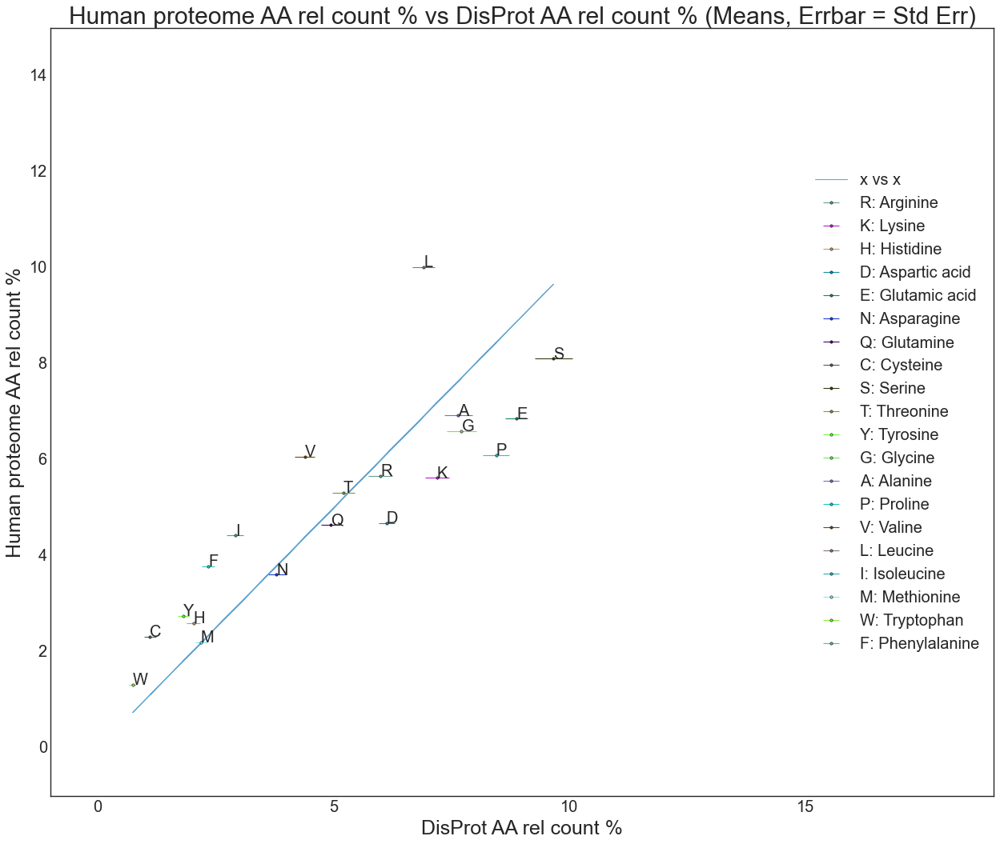

In [27]:
x = means_disprot; y_bottom = left_stderr_disprot; y_top   = right_stderr_disprot
y = [ freq * 100 for freq in gpcr.CODONS_HOMO_SAPIENS_DF["freq_aa"] ]

yerr_bottom = y       - y_bottom
yerr_top    = y_top   - y

fig = gpcr.line_compare_points( x = x,
                                y = y,
                         xerr                = (xerr_left,   xerr_right),
                         # yerr                = (yerr_bottom, yerr_top),
                         figsize             = (19,15),
                         scatter_marker_size = 3,
                         scale_factor        = 0.6,
                         errbar_linewidth    = 1,
                         errorbar_capsize    = 0,
                         errorbar_capthick   = 0,
                         legend_location     = "center right",
                         xlim                = (-1, 19),
                         ylim                = (-1, 15),
                         label_xaxis         = "DisProt AA rel count %",
                         label_yaxis         = "Human proteome AA rel count %",
                         title_add           = f" (Means, Errbar = Std Err)"
                       ) 

# <span style="color:red"> GPCRDB AA-pair Co-occurrence probability </span>

# <span style="color:orange"> GPCRDB AA-pair Co-occurrence probability: all tails </span>

In [28]:
gpcr.GPCRDB_DF.tail()

,gene,class,name,seq_len,helix_8,seq
364,GRM5,C,Metabotropic glutamate receptor 5,372,KVYIILAKPERNVRSAFTTS,TVVRMHVGDGKSSSAASRSSSLVNLWKRRGSSGETLRYKDRRLAQH...
365,ADGRB1,AD,Adhesion G protein-coupled receptor B1,380,RREVQDAVKCRVVDRQE,EGNGDSGGSFQNGHAQLMTDFEKDVDLACRSVLNKDIAACRTATIT...
366,GPR156,C,Probable G-protein coupled receptor 156,484,PQLKQWKAFEEENQTIRRMAK,YFSTPNKSFHTQYGEEENCHPRGEKSSMERLLTEKNAVIESLQEQV...
367,CELSR3,AD,Cadherin EGF LAG seven-pass G-type receptor 3,521,NADARAAWMPACLGRKA,APEEARPAPGLGPGAYNNTALFEESGLIRITLGASTVSSVSSARSG...
368,GPR158,C,Probable G-protein coupled receptor 158,530,PKFSHSSNNPRDDIATEAYED,ELDMGRSGSYLNSSINSAWSEHSLDPEDIRDELKKLYAQLEIYKRK...


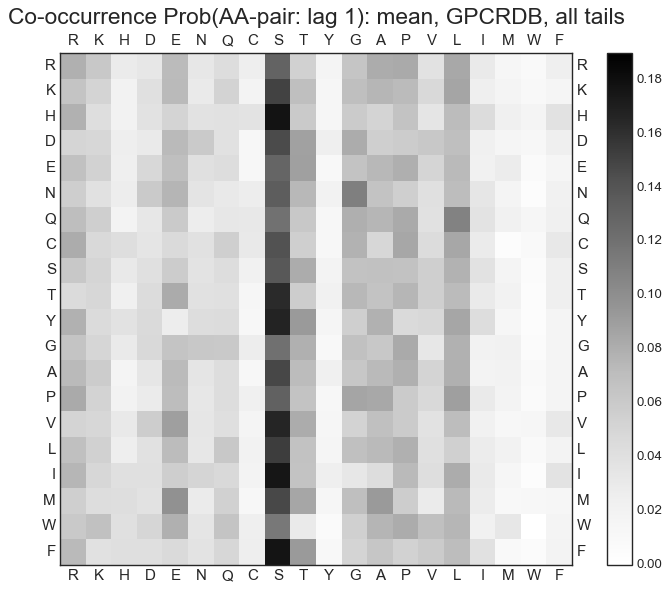

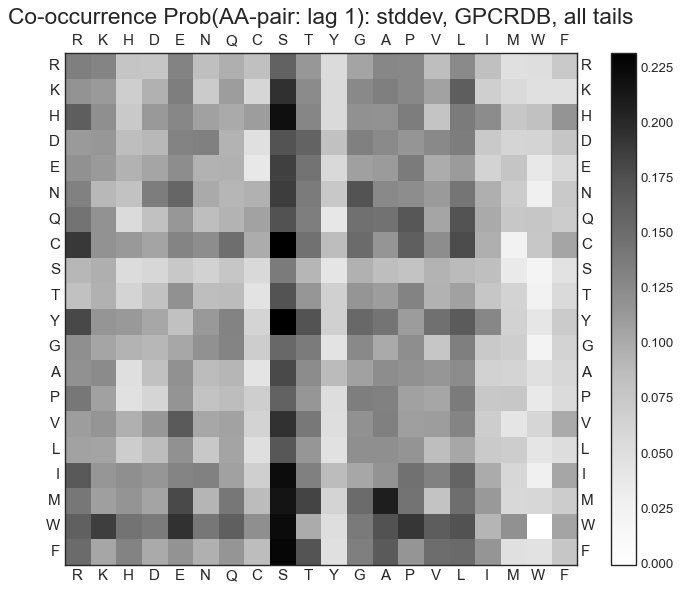

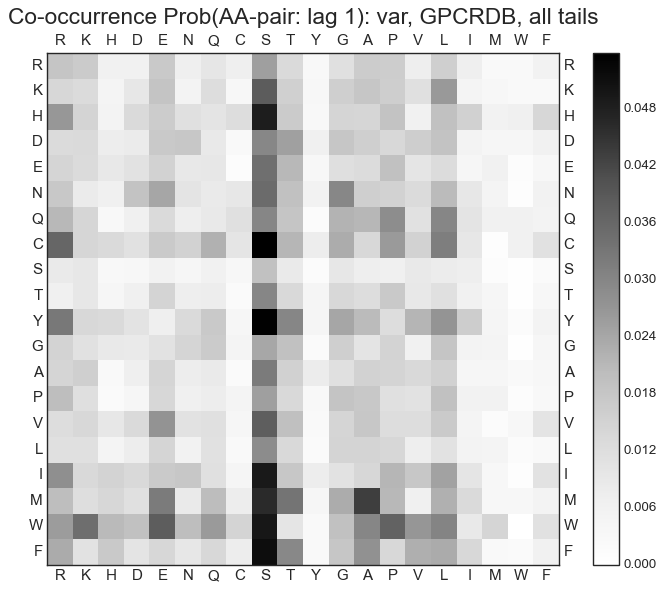

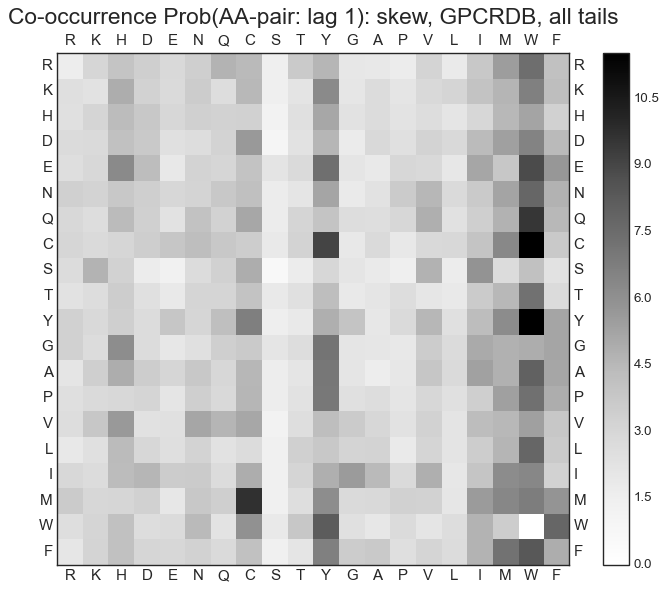

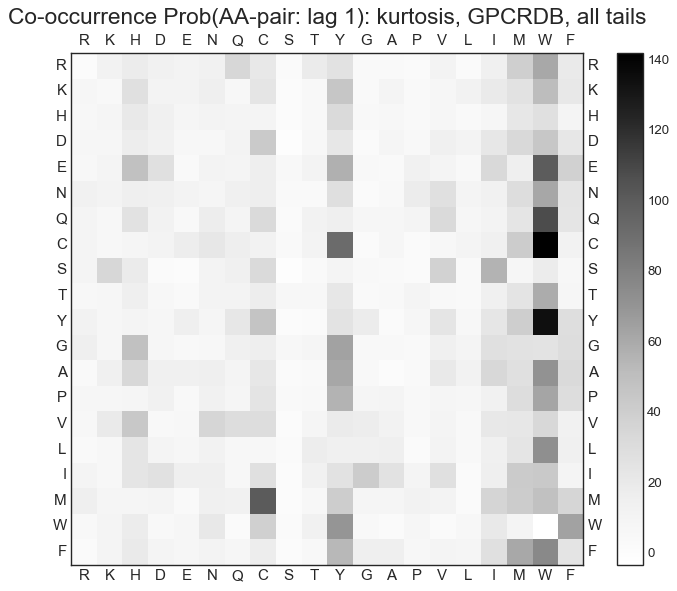

7.9410083293914795
19.999999999999996


In [29]:
start = time.time()
figs_all_tails, fig_all_tails_list, dfs_all_tails, df_all_tails_list = gpcr.heatmap_1 (
                                   df  = gpcr.GPCRDB_DF,
                                   # savefig           = True,
                                   # get_figlist       = True,
                                   lag               = 1,
                                   clim              = (0, 0.19),
                                   moments           = "all",
                                   title_add         = ", all tails"
                                 )
print( time.time() - start )
if dfs_all_tails is not None: print( sum( dfs_all_tails[0].sum() ) ) 

# <span style="color:orange"> GPCRDB AA-pair Co-occurrence probability: short tails </span>

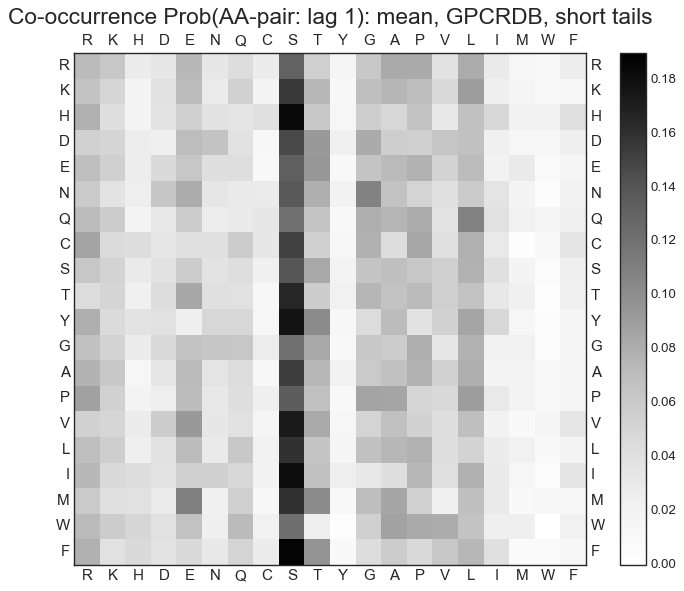

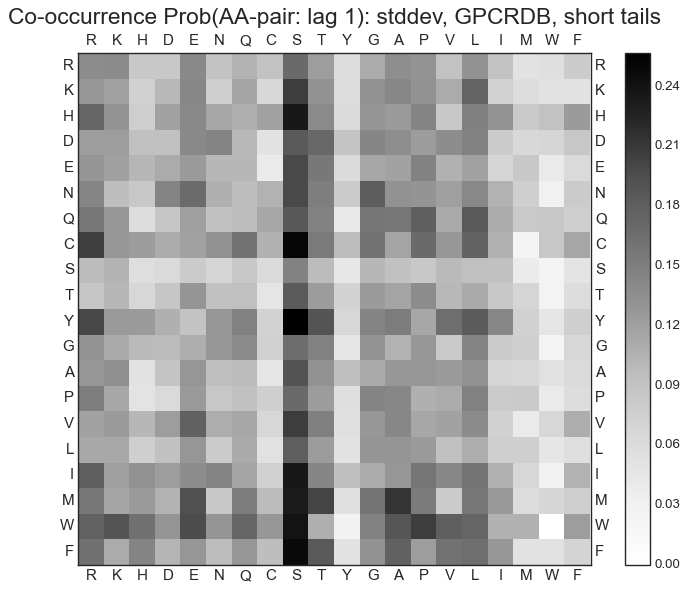

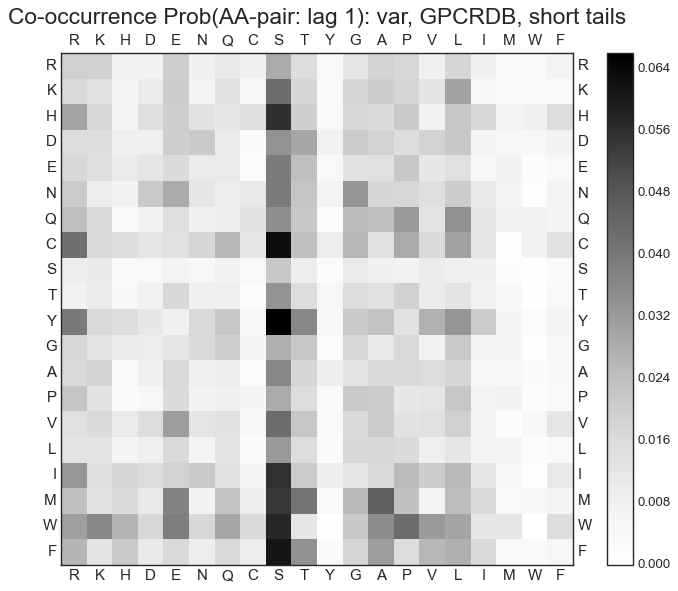

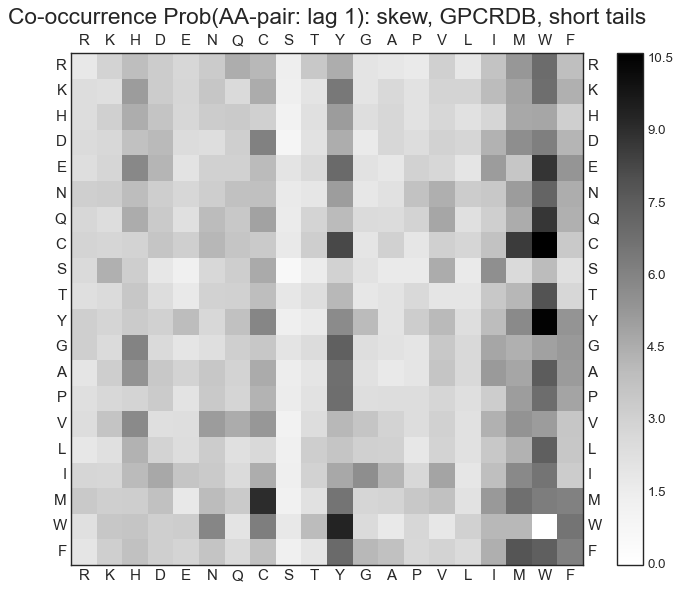

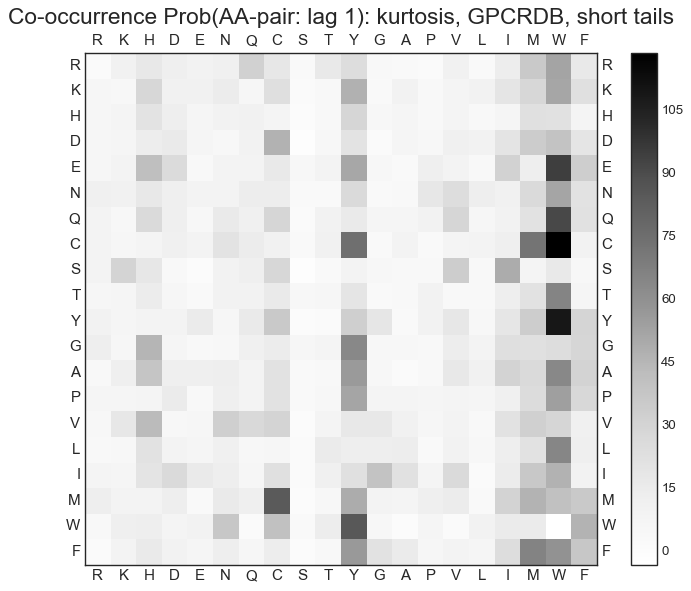

6.786882400512695
19.999999999999996


In [30]:
start = time.time()
figs_short, fig_short_list, dfs_short, df_short_list = gpcr.heatmap_1 (
                                   df  = gpcr.GPCRDB_DF,
                                   # savefig           = True,
                                   # get_figlist       = True,
                                   lag               = 1,
                                   clim              = (0, 0.19),
                                   moments           = "all",
                                   # threshold_len_min = "default",
                                   threshold_len_max = gpcr.GPCR_DF.threshold,
                                   title_add         = ", short tails"
                                 )
print( time.time() - start )
if dfs_short is not None: print( sum( dfs_short[0].sum() ) ) 

# <span style="color:orange"> GPCRDB AA-pair Co-occurrence probability: long tails </span>

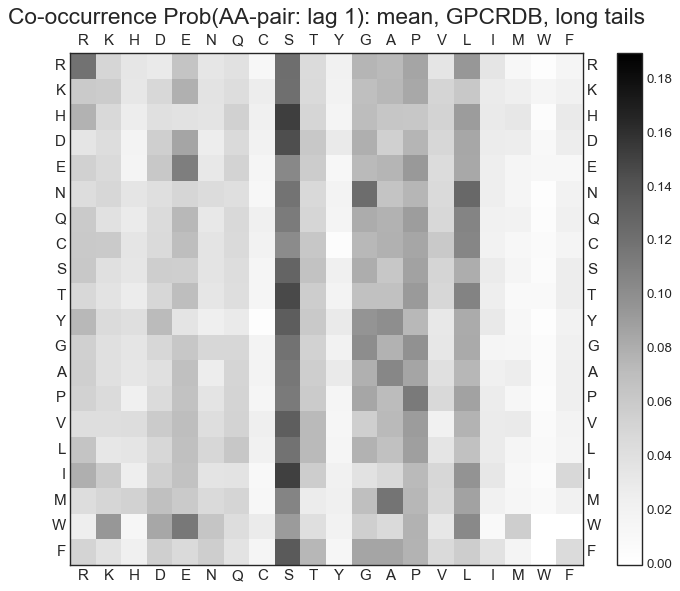

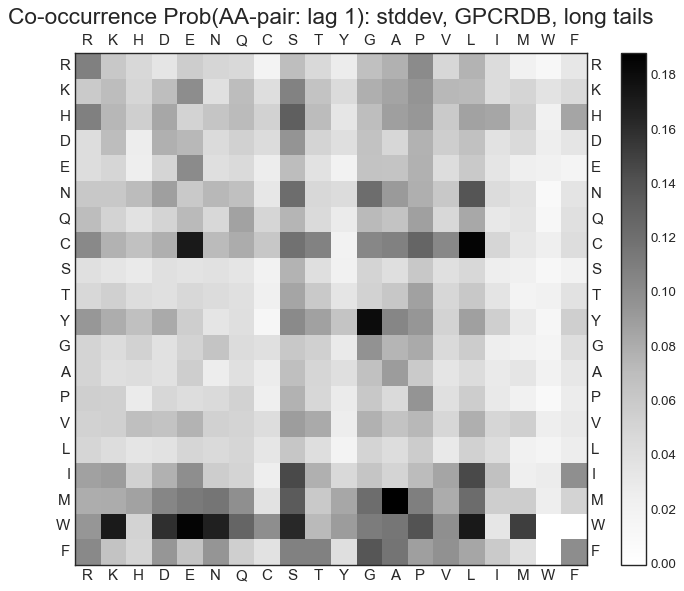

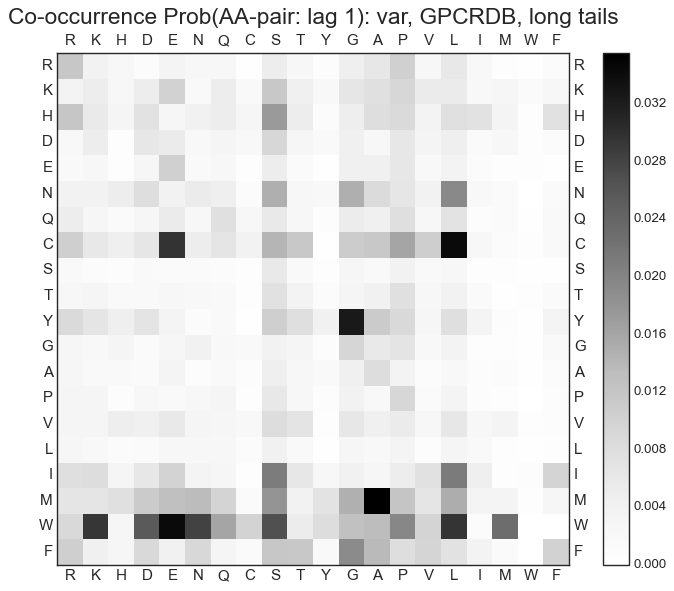

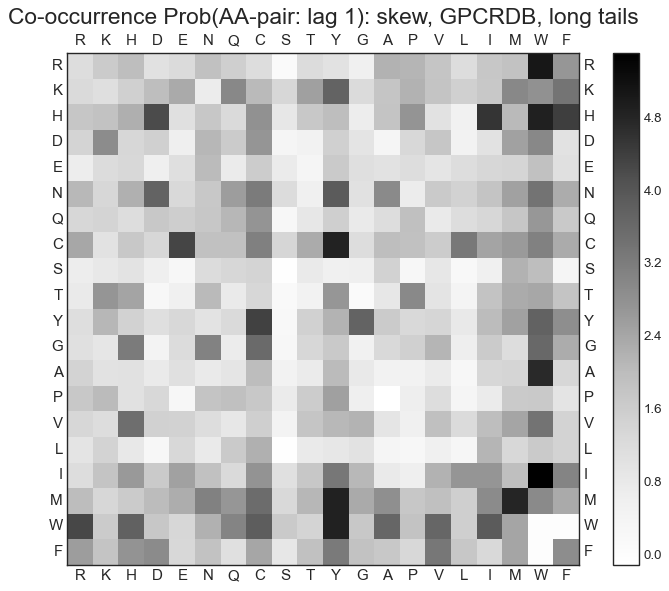

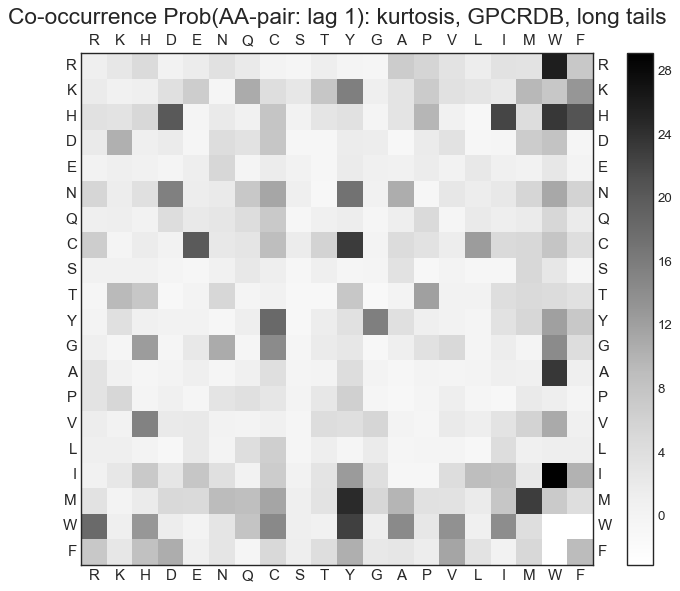

6.683103084564209
20.000000000000004


In [31]:
start = time.time()
figs_long, fig_long_list, dfs_long, df_long_list = gpcr.heatmap_1 (
                                   df  = gpcr.GPCRDB_DF,
                                   # savefig           = True,
                                   # get_figlist       = True,
                                   lag               = 1,
                                   clim              = (0, 0.19),
                                   moments           = "all",
                                   threshold_len_min = gpcr.GPCR_DF.threshold,
                                   # threshold_len_max = "default",
                                   title_add         = ", long tails"
                                 )
print( time.time() - start )
if dfs_long is not None: print( sum( dfs_long[0].sum() ) )

# <span style="color:red"> Hydrophobicity in GPCRDB </span>

# <span style="color:orange"> Hydrophobicity in GPCRDB at ph = 2 </span>

### All tails

100% |########################################################################|


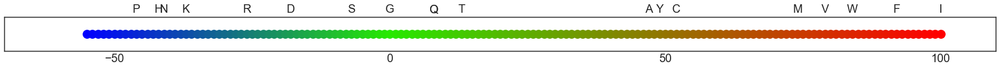

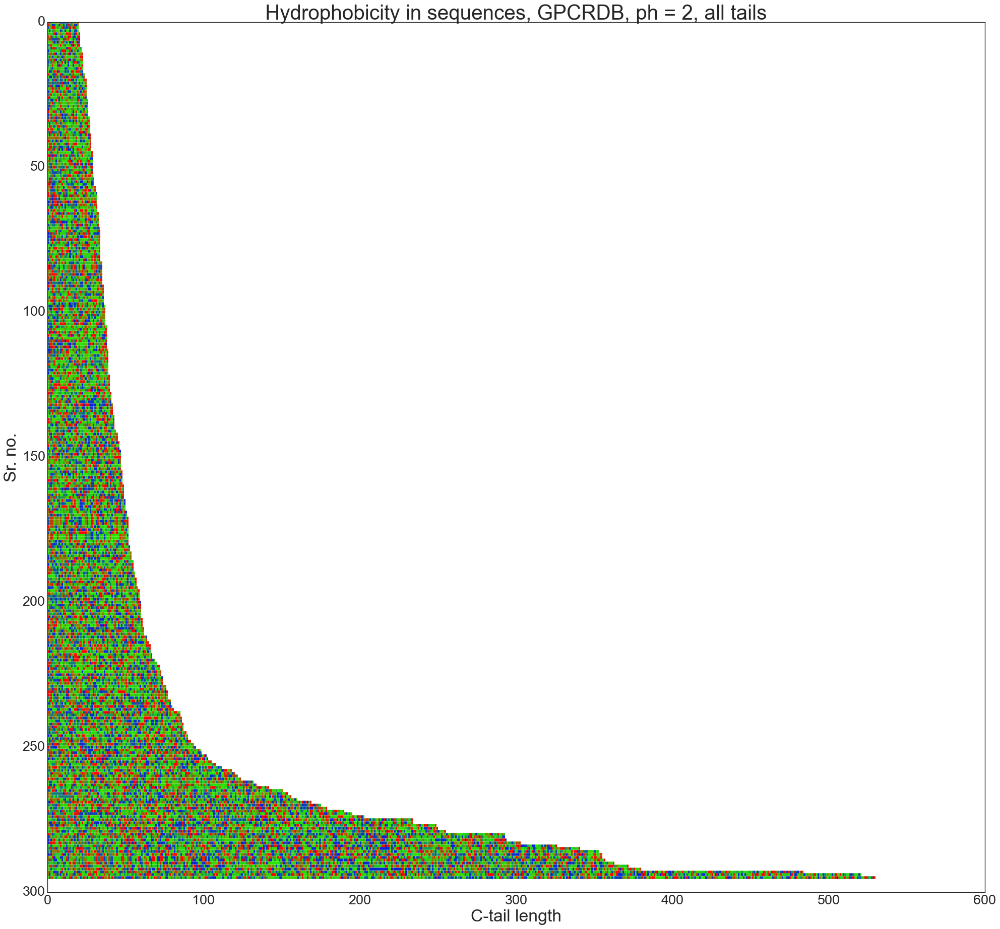

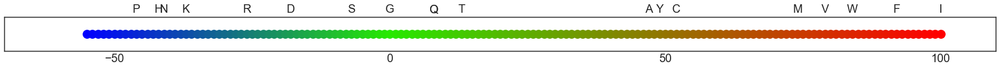

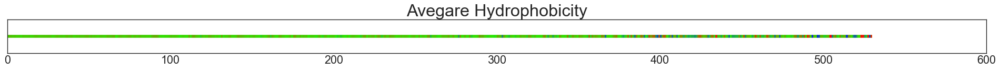

In [32]:
_ = gpcr.line_hydrophobicity_in_sequences( df           = gpcr.GPCRDB_DF,
                                           scale_factor = 0.45,
                                           figsize      = (30, 27),
                                           savefig      = False,
                                           title_add    = ", ph = 2, all tails"
                                         ) 

100% |########################################################################|


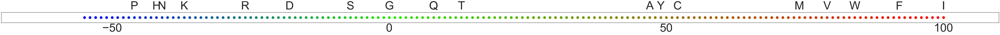

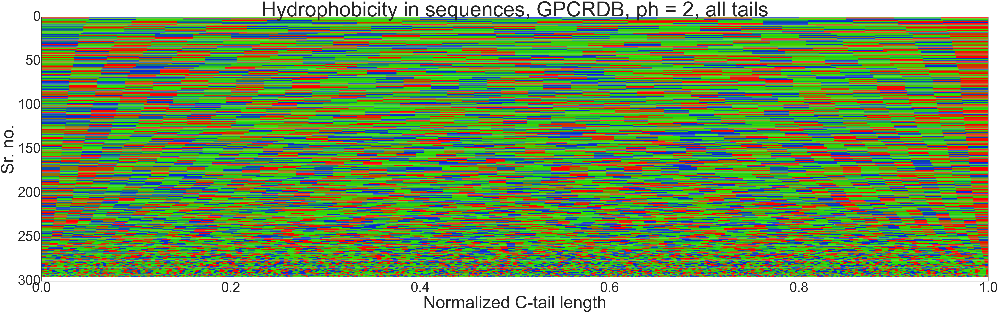

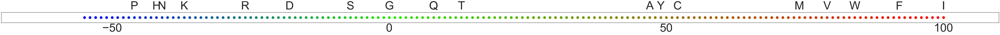

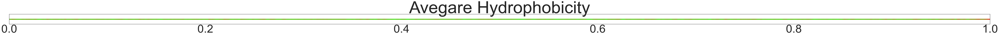

In [17]:
_ = gpcr.line_hydrophobicity_in_sequences( df           = gpcr.GPCRDB_DF,
                                           normalized   = True,
                                           scale_factor = 1.5,
                                           figsize      = (100, 27),
                                           savefig      = False,
                                           title_add    = ", ph = 2, all tails"
                                         ) 

### Long tails

100% |########################################################################|


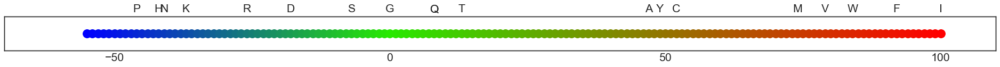

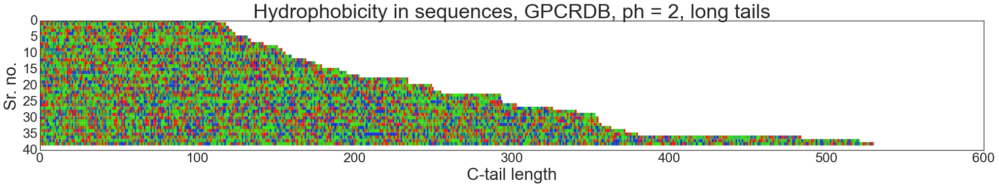

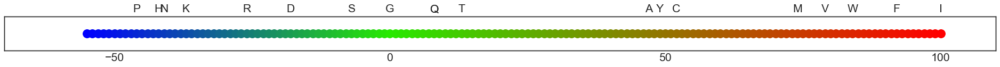

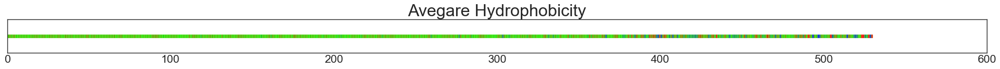

In [16]:
_ = gpcr.line_hydrophobicity_in_sequences( df           = gpcr.GPCRDB_DF,
                                           linewidth    = 6,
                                           scale_factor = 3,
                                           figsize      = (30, 4),
                                           savefig      = False,
                                           threshold_len_min   = 110,
                                           # threshold_len_max   = None,
                                           title_add    = ", ph = 2, long tails"
                                         ) 

100% |########################################################################|


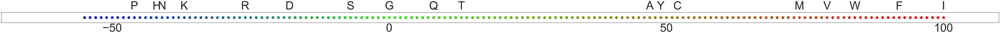

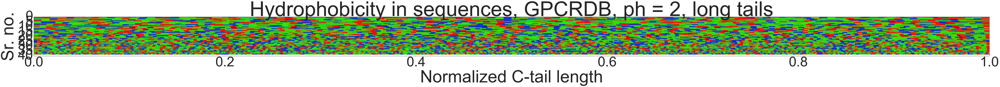

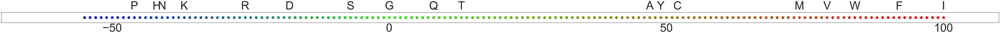

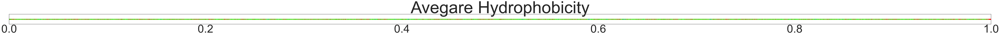

In [3]:
_, hydro_avg = gpcr.line_hydrophobicity_in_sequences( df           = gpcr.GPCRDB_DF,
                                           normalized   = True,
                                           linewidth    = 6,
                                           scale_factor = 10,
                                           figsize      = (100, 4),
                                           savefig      = False,
                                           threshold_len_min   = 110,
                                           # threshold_len_max   = None,
                                           title_add    = ", ph = 2, long tails"
                                         ) 

In [4]:
print(max(hydro_avg))
print(min(hydro_avg))

96.57765742053049
-24.568424782344604


In [20]:
gpcr.AA.HYDRO_PHOBICITY_PH2

{'R': -26,
 'K': -37,
 'H': -42,
 'D': -18,
 'E': 8,
 'N': -41,
 'Q': 8,
 'C': 52,
 'S': -7,
 'T': 13,
 'Y': 49,
 'G': 0,
 'A': 47,
 'P': -46,
 'V': 79,
 'L': 100,
 'I': 100,
 'M': 74,
 'W': 84,
 'F': 92}

### Short tails

100% |########################################################################|


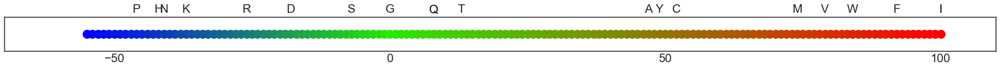

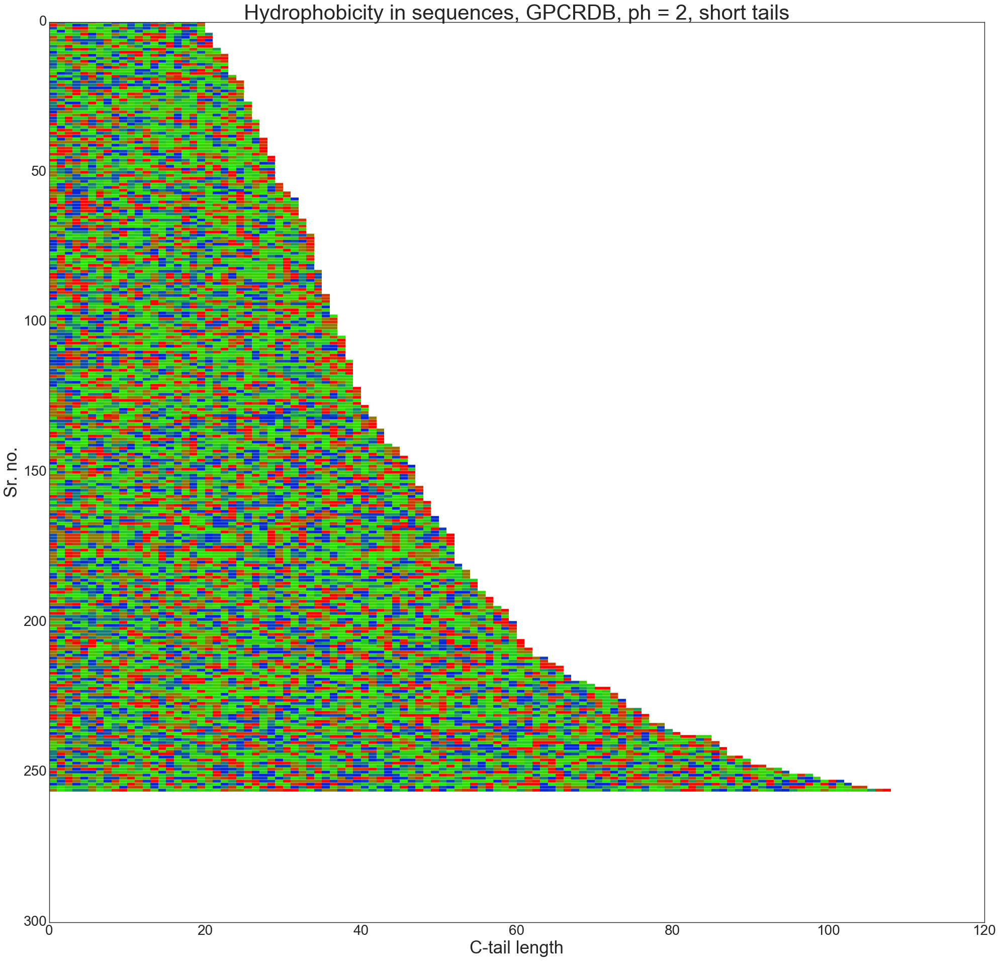

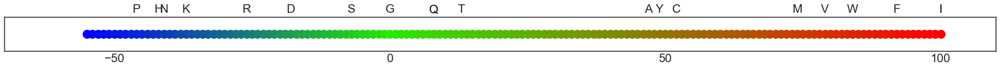

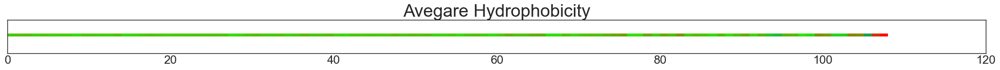

In [34]:
_ = gpcr.line_hydrophobicity_in_sequences( df           = gpcr.GPCRDB_DF,
                                           scale_factor = 0.45,
                                           figsize      = (30, 28),
                                           savefig      = False,
                                           # threshold_len_min   = None,
                                           threshold_len_max   = 110,
                                           title_add    = ", ph = 2, short tails"
                                         ) 

100% |########################################################################|


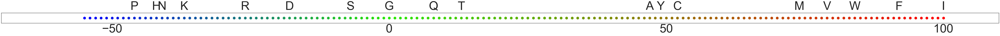

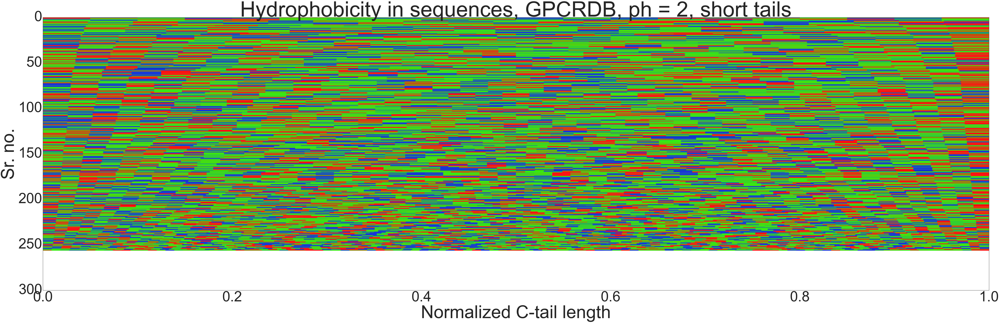

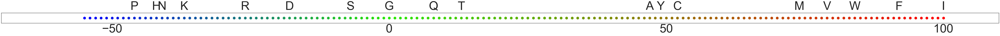

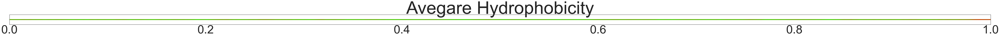

In [19]:
_ = gpcr.line_hydrophobicity_in_sequences( df           = gpcr.GPCRDB_DF,
                                           normalized   = True,
                                           scale_factor = 1.5,
                                           figsize      = (100, 28),
                                           savefig      = False,
                                           # threshold_len_min   = None,
                                           threshold_len_max   = 110,
                                           title_add    = ", ph = 2, short tails"
                                         ) 

# <span style="color:orange"> Hydrophobicity in GPCRDB at ph = 7 </span>

### All tails

100% |########################################################################|


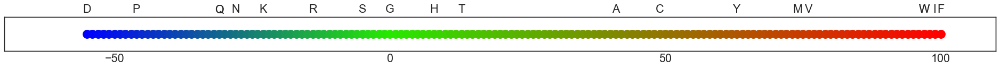

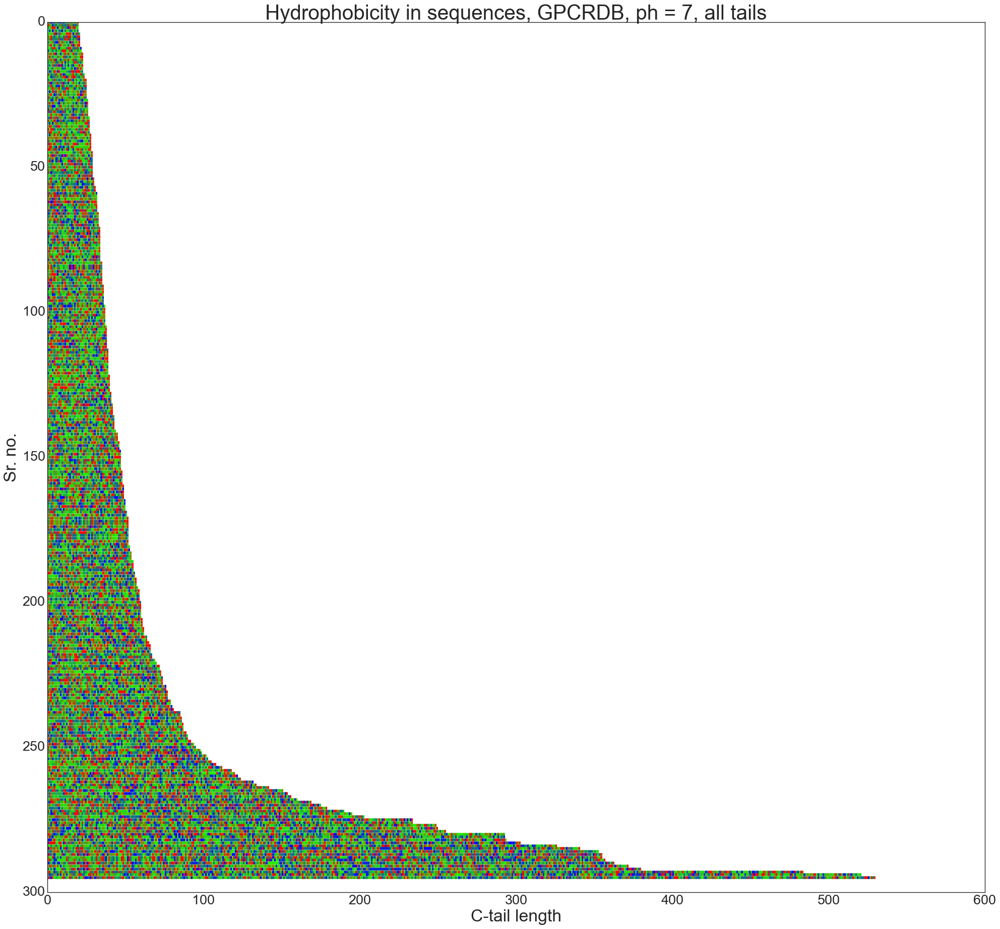

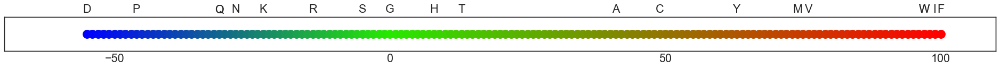

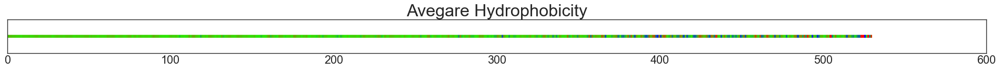

In [35]:
_ = gpcr.line_hydrophobicity_in_sequences( df           = gpcr.GPCRDB_DF,
                                           hydrophobicity_aas = gpcr.AA.HYDRO_PHOBICITY_PH7,
                                           scale_factor = 0.45,
                                           figsize      = (30, 27),
                                           savefig      = False,
                                           title_add    = ", ph = 7, all tails"
                                         ) 

100% |########################################################################|


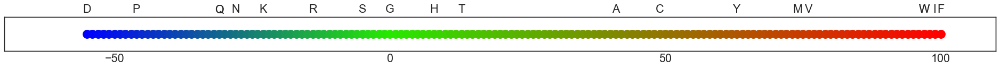

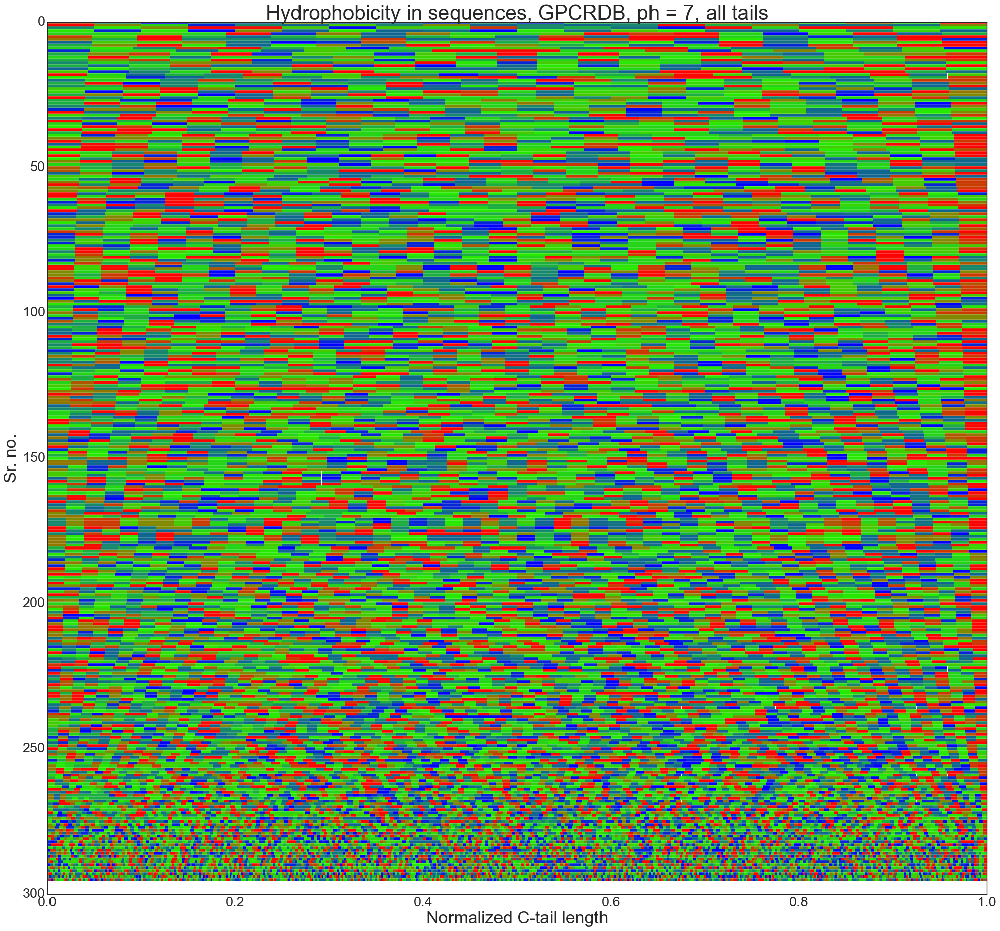

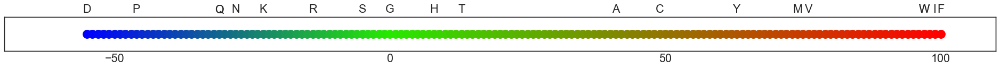

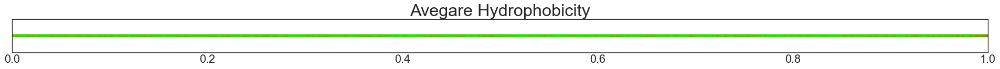

In [44]:
_ = gpcr.line_hydrophobicity_in_sequences( df           = gpcr.GPCRDB_DF,
                                           normalized   = True,
                                           hydrophobicity_aas = gpcr.AA.HYDRO_PHOBICITY_PH7,
                                           scale_factor = 0.45,
                                           figsize      = (30, 27),
                                           savefig      = False,
                                           title_add    = ", ph = 7, all tails"
                                         ) 

### Long tails

100% |########################################################################|


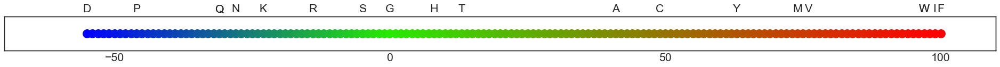

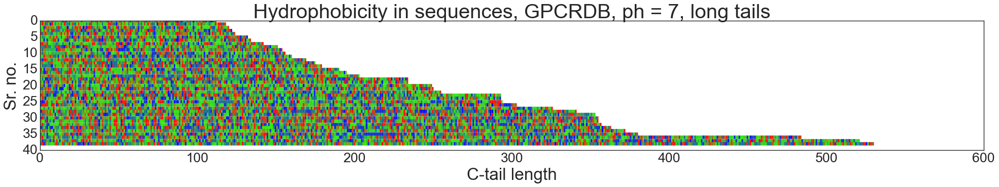

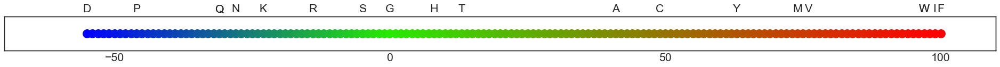

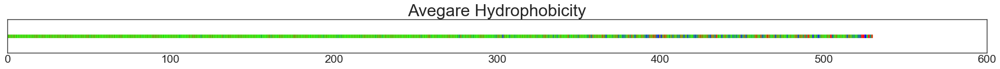

In [36]:
_ = gpcr.line_hydrophobicity_in_sequences( df                 = gpcr.GPCRDB_DF,
                                           hydrophobicity_aas = gpcr.AA.HYDRO_PHOBICITY_PH7,
                                           linewidth          = 6,
                                           scale_factor       = 3,
                                           figsize            = (30, 4),
                                           savefig            = False,
                                           threshold_len_min  = 110,
                                           # threshold_len_max  = None,
                                           title_add          = ", ph = 7, long tails"
                                         ) 

100% |########################################################################|


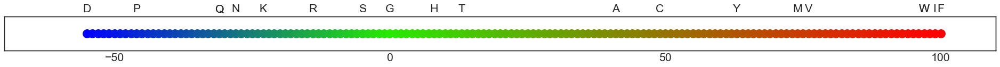

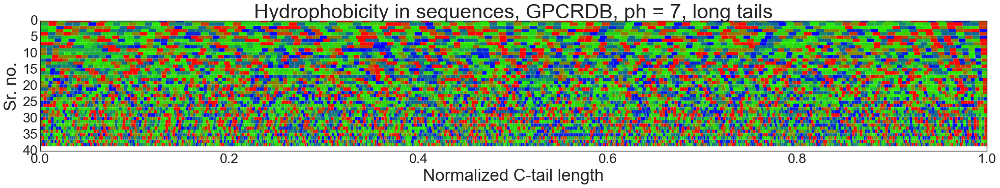

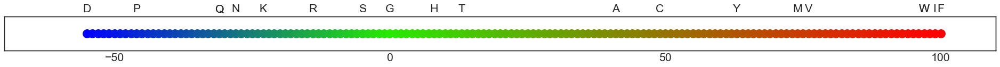

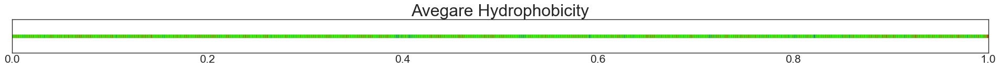

In [45]:
_ = gpcr.line_hydrophobicity_in_sequences( df                 = gpcr.GPCRDB_DF,
                                           normalized         = True,
                                           hydrophobicity_aas = gpcr.AA.HYDRO_PHOBICITY_PH7,
                                           linewidth          = 6,
                                           scale_factor       = 3,
                                           figsize            = (30, 4),
                                           savefig            = False,
                                           threshold_len_min  = 110,
                                           # threshold_len_max  = None,
                                           title_add          = ", ph = 7, long tails"
                                         ) 

### Short tails

100% |########################################################################|


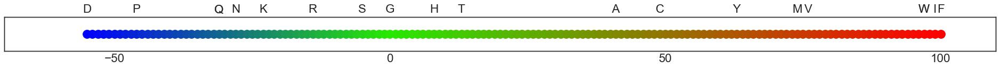

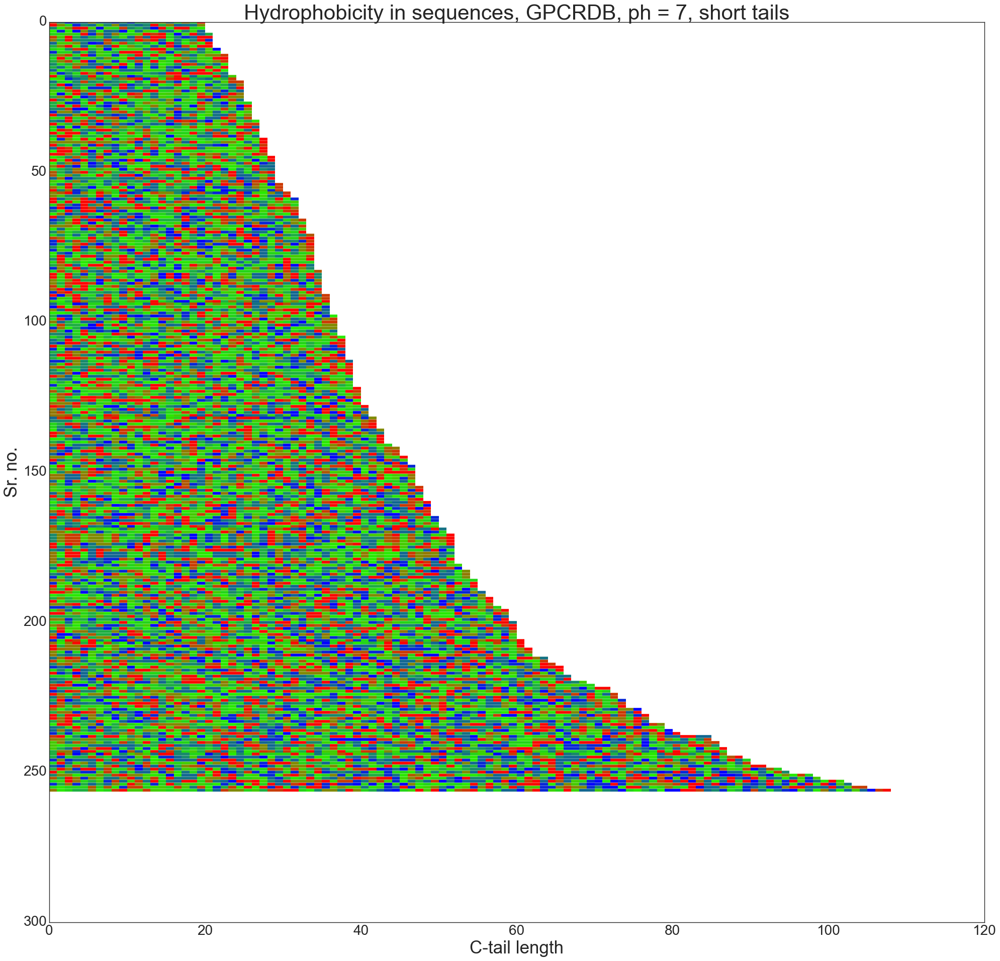

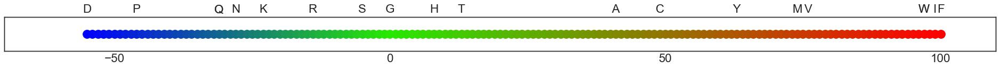

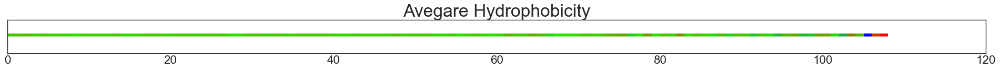

In [37]:
_ = gpcr.line_hydrophobicity_in_sequences( df                 = gpcr.GPCRDB_DF,
                                           hydrophobicity_aas = gpcr.AA.HYDRO_PHOBICITY_PH7,
                                           scale_factor       = 0.45,
                                           figsize            = (30, 28),
                                           savefig            = False,
                                           # threshold_len_min  = None,
                                           threshold_len_max  = 110,
                                           title_add          = ", ph = 7, short tails"
                                         ) 

100% |########################################################################|


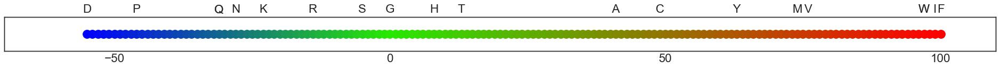

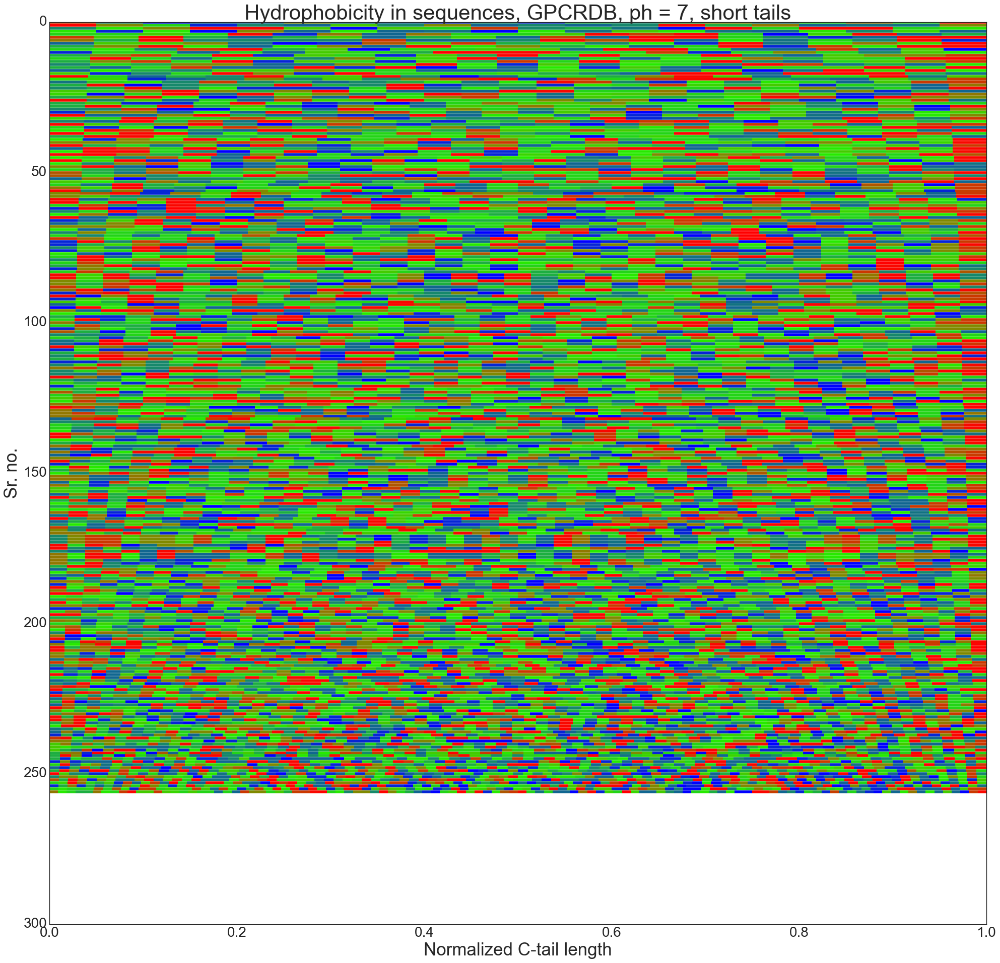

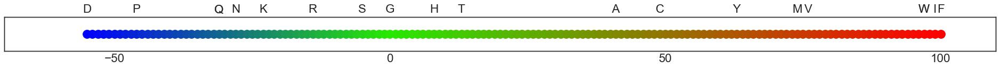

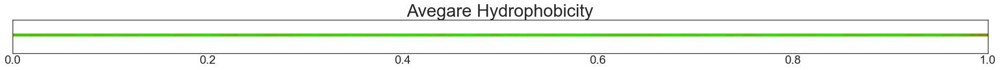

In [46]:
_ = gpcr.line_hydrophobicity_in_sequences( df                 = gpcr.GPCRDB_DF,
                                           normalized         = True,
                                           hydrophobicity_aas = gpcr.AA.HYDRO_PHOBICITY_PH7,
                                           scale_factor       = 0.45,
                                           figsize            = (30, 28),
                                           savefig            = False,
                                           # threshold_len_min  = None,
                                           threshold_len_max  = 110,
                                           title_add          = ", ph = 7, short tails"
                                         ) 

# <span style="color:red"> Charges in GPCRDB </span>

# <span style="color:orange"> Charges in GPCRDB at ph = 7 </span>

### All tails

100% |########################################################################|


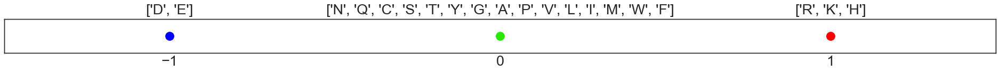

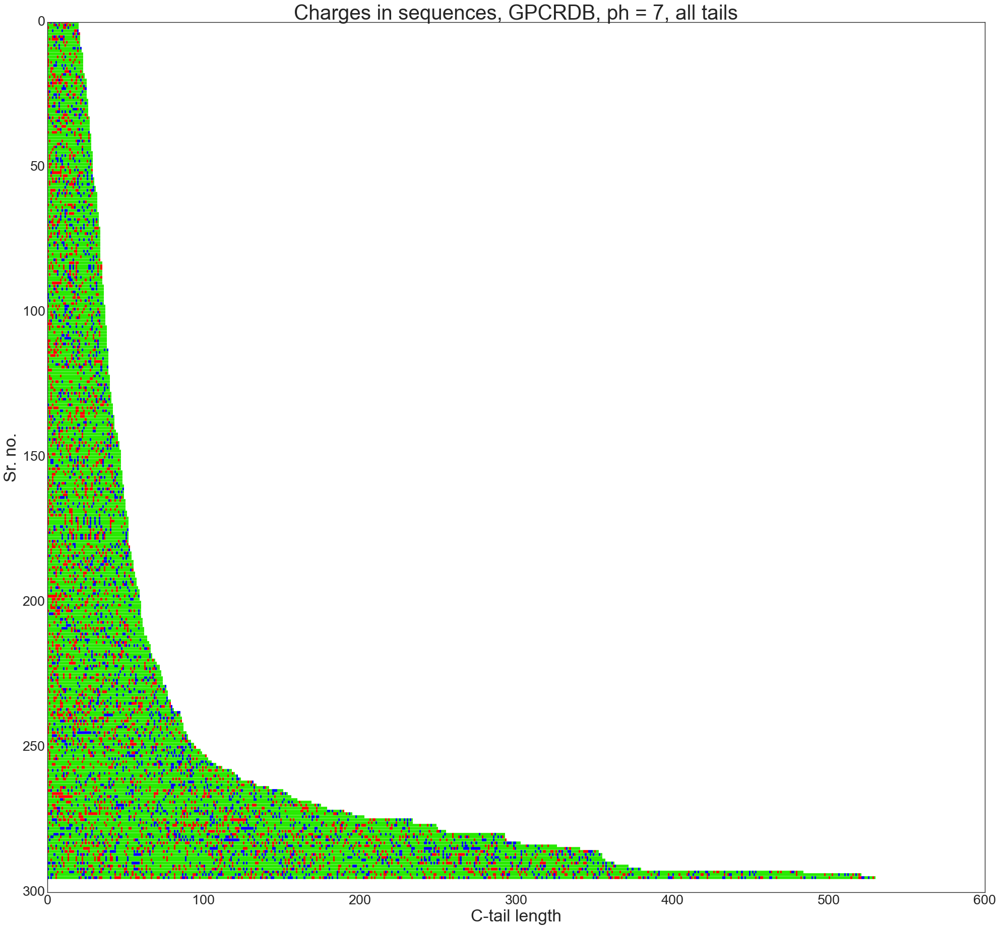

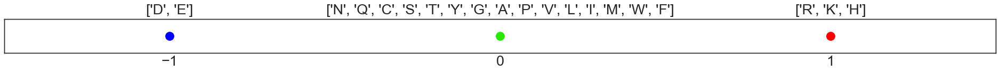

In [38]:
_ = gpcr.line_charges_in_sequences( df           = gpcr.GPCRDB_DF,
                                    charges_aas  = gpcr.AA.CHARGES_PH7,
                                    scale_factor = 0.45,
                                    figsize      = (30, 27),
                                    savefig      = False,
                                    title_add    = ", ph = 7, all tails"
                                    ) 

### Long tails

100% |########################################################################|


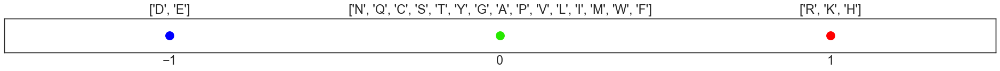

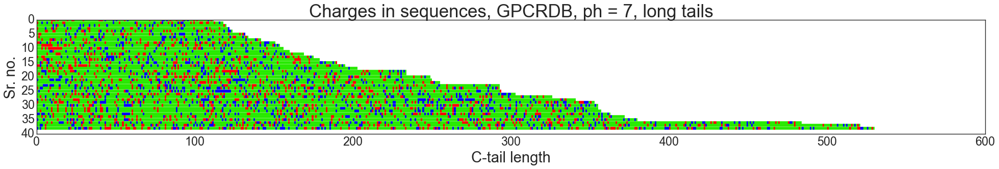

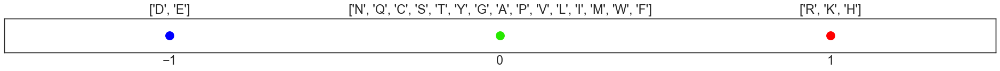

In [39]:
_ = gpcr.line_charges_in_sequences( df           = gpcr.GPCRDB_DF,
                                    charges_aas  = gpcr.AA.CHARGES_PH7,
                                    scale_factor = 3,
                                    figsize      = (30, 3.5),
                                    # normalized   = False,
                                    savefig      = False,
                                    threshold_len_min   = 110,
                                    # threshold_len_max   = None,
                                    title_add    = ", ph = 7, long tails"
                                    ) 

### Short tails

100% |########################################################################|


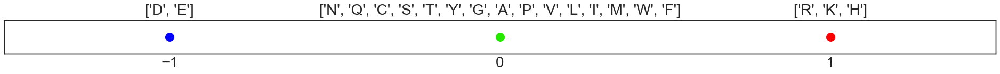

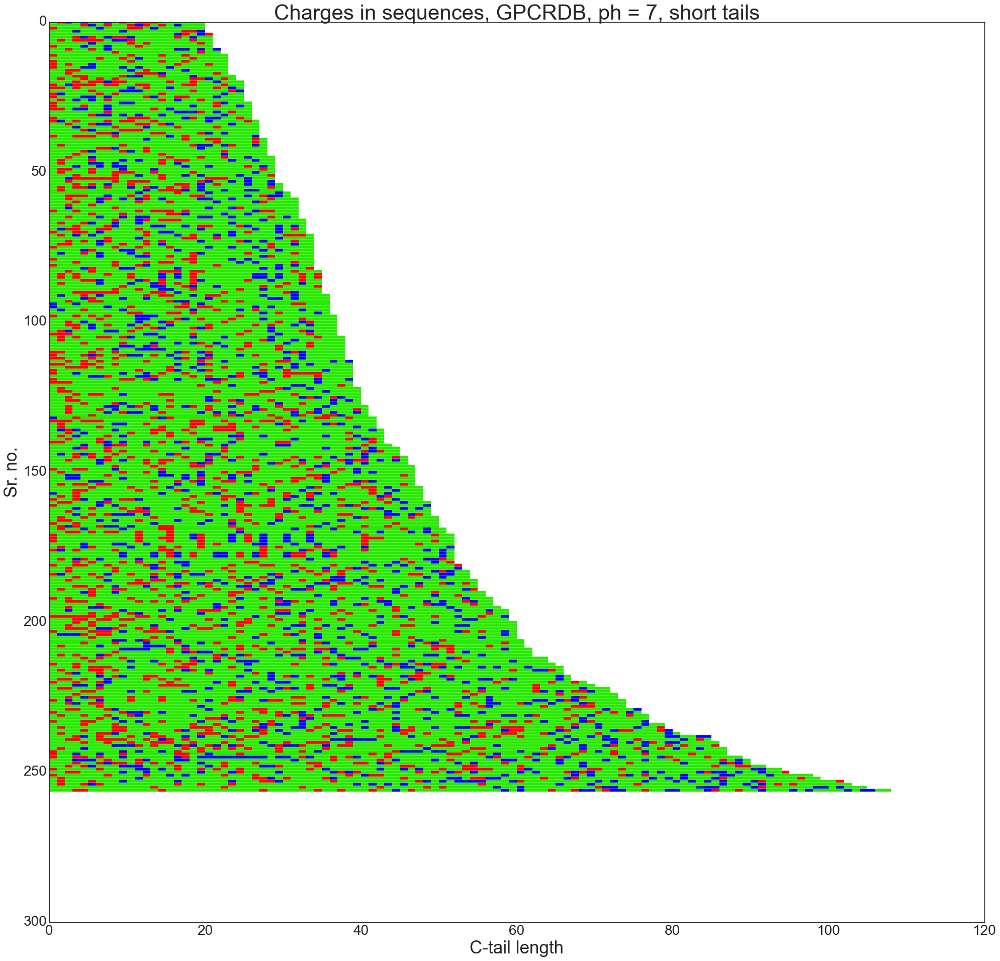

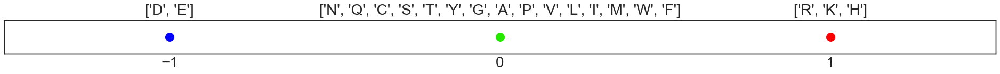

In [40]:
_ = gpcr.line_charges_in_sequences( df           = gpcr.GPCRDB_DF,
                                    charges_aas  = gpcr.AA.CHARGES_PH7,
                                    scale_factor = 0.45,
                                    figsize      = (30, 28),
                                    savefig      = False,
                                    # threshold_len_min   = None,
                                    threshold_len_max   = 110,
                                    title_add    = ", ph = 7, short tails"
                                    ) 